In [1]:
import matplotlib.pyplot as plt

from skimage.color import rgb2gray, rgba2rgb
import skimage.io as skio
from skimage.util.shape import view_as_windows
from skimage.transform import resize

import numpy as np
import pandas as pd 
from scipy import stats  
from einops import rearrange, reduce, repeat

import itertools
import os
import glob
import warnings
import tqdm

from utils import default_paths

In [132]:
out = np.load(fn2save, allow_pickle=True).item()

In [133]:
out.keys()

dict_keys(['file_list', 'all_curv_filt_coeffs', 'all_rect_filt_coeffs', 'all_lin_filt_coeffs', 'curv_kernel_pars', 'rect_kernel_pars', 'lin_kernel_pars'])

In [113]:
n_scales = len(bank.scale_values)
n_bends = len(bank.bend_values)
n_orients = len(bank.orient_values)

filt_coeffs = bank.filter_image_batch(image_batch, which_kernels='curv')
mean_curv = np.mean(np.mean(np.mean(filt_coeffs, axis=0),axis=0), axis=0)
max_curv_map = np.max(filt_coeffs, axis=2)
mean_curv_map = np.mean(filt_coeffs, axis=2)
coeff_each_prop_curv = np.reshape(np.mean(np.mean(filt_coeffs, axis=0), axis=0), \
                            [n_scales, n_bends-1, n_orients, n_images])
max_curv_map_each_scale = np.mean(np.mean(coeff_each_prop_curv, axis=1), axis=1)

filt_coeffs = bank.filter_image_batch(image_batch, which_kernels='rect')
mean_rect = np.mean(np.mean(np.mean(filt_coeffs, axis=0),axis=0), axis=0)
max_rect_map = np.max(filt_coeffs, axis=2)
mean_rect_map = np.mean(filt_coeffs, axis=2)
coeff_each_prop_rect = np.reshape(np.mean(np.mean(filt_coeffs, axis=0), axis=0), \
                            [n_scales, n_bends-1, n_orients, n_images])
max_rect_map_each_scale = np.mean(np.mean(coeff_each_prop_rect, axis=1), axis=1)


filt_coeffs = bank.filter_image_batch(image_batch, which_kernels='linear')
mean_lin = np.mean(np.mean(np.mean(filt_coeffs, axis=0),axis=0), axis=0)
max_lin_map = np.max(filt_coeffs, axis=2)
mean_lin_map = np.mean(filt_coeffs, axis=2)
coeff_each_prop_lin = np.reshape(np.mean(np.mean(filt_coeffs, axis=0), axis=0), \
                            [n_scales, 1, n_orients, n_images])
max_lin_map_each_scale = np.mean(np.mean(coeff_each_prop_lin, axis=1), axis=1)

which_max = np.argmax(np.array([max_curv_map, max_rect_map, max_lin_map]), axis=0)

In [119]:
np.unique(np.argmax(filt_coeffs, axis=2))

array([16, 20, 24, 25, 26, 27, 28, 29, 30, 31])

In [120]:
filt_coeffs.shape

(128, 128, 32, 10)

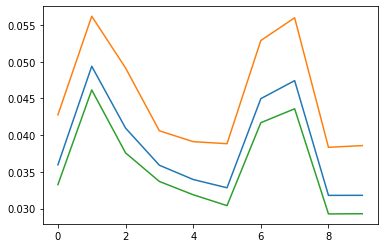

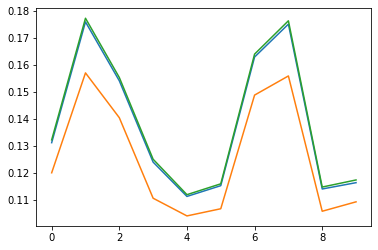

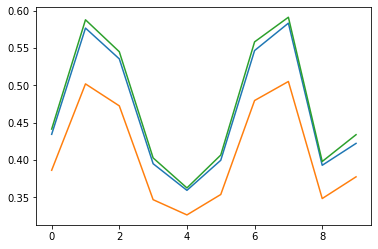

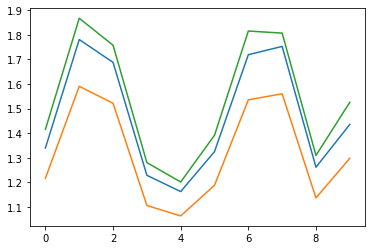

In [115]:
for sc in range(4):
    plt.figure();
    plt.plot(max_curv_map_each_scale[sc,:])
    plt.plot(max_rect_map_each_scale[sc,:])
    plt.plot(max_lin_map_each_scale[sc,:])

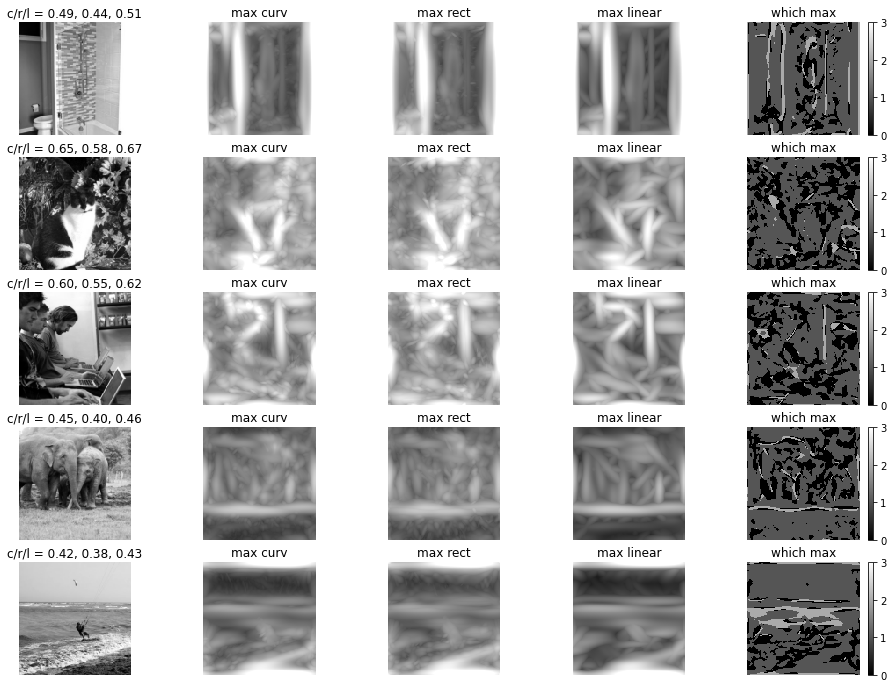

In [112]:
plt.figure(figsize=(16,12));
pi=0
ims2plot = np.arange(5)
vmax = 4.0
for ii in ims2plot:
    
    pi+=1
    plt.subplot(len(ims2plot),5,pi);
    plt.pcolormesh(image_list[ii], cmap='gray', clim=[0,1])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.title('c/r/l = %.2f, %.2f, %.2f'%(mean_curv[ii], mean_rect[ii], mean_lin[ii]))
    plt.axis('off')
    
    pi+=1
    plt.subplot(len(ims2plot),5,pi);
    plt.pcolormesh(max_curv_map[:,:,ii], cmap='gray', vmin=0, vmax=vmax)
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.title('max curv')
    plt.axis('off')
    
    pi+=1
    plt.subplot(len(ims2plot),5,pi);
    plt.pcolormesh(max_rect_map[:,:,ii], cmap='gray', vmin=0, vmax=vmax)
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.title('max rect')
    plt.axis('off')
    
    pi+=1
    plt.subplot(len(ims2plot),5,pi);
    plt.pcolormesh(max_lin_map[:,:,ii], cmap='gray', vmin=0, vmax=vmax)
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.title('max linear')
    plt.axis('off')
    
    pi+=1
    plt.subplot(len(ims2plot),5,pi);
    plt.pcolormesh(which_max[:,:,ii], cmap='gray', vmin=0, vmax=3)
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.title('which max')
    plt.axis('off')
    
    plt.colorbar()
#     pi+=1
#     plt.subplot(len(ims2plot),5,pi);
#     plt.pcolormesh(mean_curv_map[:,:,ii], cmap='gray', vmin=0, vmax=1.0)
#     plt.axis('square')
#     plt.gca().invert_yaxis()
#     plt.title('mean curv')
#     plt.axis('off')
    
#     pi+=1
#     plt.subplot(len(ims2plot),5,pi);
#     plt.pcolormesh(mean_rect_map[:,:,ii], cmap='gray', vmin=0, vmax=1.0)
#     plt.axis('square')
#     plt.gca().invert_yaxis()
#     plt.title('mean rect')
#     plt.axis('off')
    
#     pi+=1
#     plt.subplot(len(ims2plot),5,pi);
#     plt.pcolormesh(mean_lin_map[:,:,ii], cmap='gray', vmin=0, vmax=1.0)
#     plt.axis('square')
#     plt.gca().invert_yaxis()
#     plt.title('mean linear')
#     plt.axis('off')
    
#     pi+=1


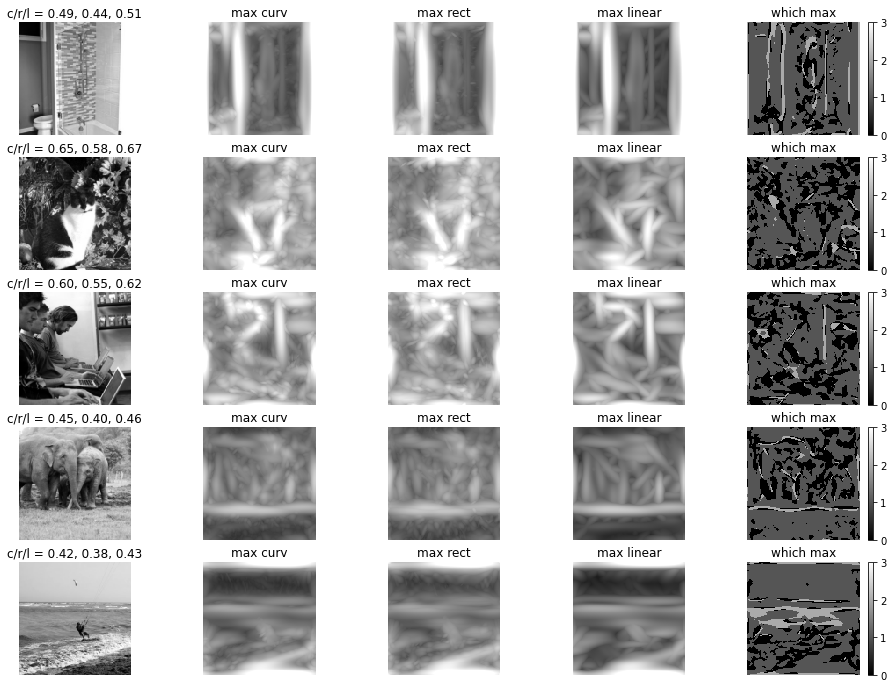

In [112]:
sc = 0;

plt.figure(figsize=(16,12));
pi=0
ims2plot = np.arange(5)
vmax = 4.0
for ii in ims2plot:
    
    pi+=1
    plt.subplot(len(ims2plot),5,pi);
    plt.pcolormesh(image_list[ii], cmap='gray', clim=[0,1])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.title('c/r/l = %.2f, %.2f, %.2f'%(mean_curv[ii], mean_rect[ii], mean_lin[ii]))
    plt.axis('off')
    
    pi+=1
    plt.subplot(len(ims2plot),5,pi);
    plt.pcolormesh(np.max, cmap='gray', vmin=0, vmax=vmax)
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.title('max curv')
    plt.axis('off')
    
    pi+=1
    plt.subplot(len(ims2plot),5,pi);
    plt.pcolormesh(max_rect_map[:,:,ii], cmap='gray', vmin=0, vmax=vmax)
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.title('max rect')
    plt.axis('off')
    
    pi+=1
    plt.subplot(len(ims2plot),5,pi);
    plt.pcolormesh(max_lin_map[:,:,ii], cmap='gray', vmin=0, vmax=vmax)
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.title('max linear')
    plt.axis('off')
    
    pi+=1
    plt.subplot(len(ims2plot),5,pi);
    plt.pcolormesh(which_max[:,:,ii], cmap='gray', vmin=0, vmax=3)
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.title('which max')
    plt.axis('off')
    
    plt.colorbar()
#     pi+=1
#     plt.subplot(len(ims2plot),5,pi);
#     plt.pcolormesh(mean_curv_map[:,:,ii], cmap='gray', vmin=0, vmax=1.0)
#     plt.axis('square')
#     plt.gca().invert_yaxis()
#     plt.title('mean curv')
#     plt.axis('off')
    
#     pi+=1
#     plt.subplot(len(ims2plot),5,pi);
#     plt.pcolormesh(mean_rect_map[:,:,ii], cmap='gray', vmin=0, vmax=1.0)
#     plt.axis('square')
#     plt.gca().invert_yaxis()
#     plt.title('mean rect')
#     plt.axis('off')
    
#     pi+=1
#     plt.subplot(len(ims2plot),5,pi);
#     plt.pcolormesh(mean_lin_map[:,:,ii], cmap='gray', vmin=0, vmax=1.0)
#     plt.axis('square')
#     plt.gca().invert_yaxis()
#     plt.title('mean linear')
#     plt.axis('off')
    
#     pi+=1


In [348]:
"""
Code to perform curvature analysis on images corresponding to each sketch token 
feature (clusters in curvature space).
Original version from Xiaomin Yue, related to paper:
"Curvature processing in human visual cortical areas" (2020), Neuroimage.
Modified for this project by MMH, including adding option for angle detection.
Saves out a csv file listing the approx curvature params of each feature.
"""

class CurvRectValues:  
    def __init__(self, proc_cluster_ims=False, file_block_size=10):
        self.files           = []
#         self.image_size      = 128 
        self.image_size      = 240
        self.file_block_size = file_block_size
        self.images          = []
        self.fft_images      = []
        self.curv_values     = []
        self.rect_values     = []
        self.curv_max        = []
        self.rect_max        = []
        self.curv_unique     = []
        self.rect_unique     = []
        self.proc_cluster_ims= proc_cluster_ims
        self.__set_kernel_params__()
        self.__generate_kernels__()
        
    def __set_kernel_params__(self):
        
        """
        Set some default params for the banana kernels.
        mA:          magnitude value m
        xA_half:     x-size
        yA_half:     y-size
        sigmaXbend:  sigma for the bent gaussian in x-direction
        sigmaYbend:  sigma for the bent gaussian in y-direction
        xA_shift:    center shift in x direction
        yA_shift:    center shift in y direction
        
        """
        
        self.mA = 3;
        self.sigmaXbend = 2
        self.sigmaYbend = 2
        self.xA_half    = self.image_size/2
        self.yA_half    = self.image_size/2
        self.xA_shift   = 0
        self.yA_shift   = 0
        
        # now setting values that define the bank of filters we will create. 
        if self.proc_cluster_ims:
            # special case where i am working with sketch tokens "cluster" images, 
            # not natural image patches. 
            # want really fine orientation resolution/coarser scale resolution.
            self.scale_values = [9,12]
#             self.orient_values = np.linspace(0,2*np.pi,73)[0:72]
            self.orient_values = np.linspace(0,2*np.pi,25)[0:24]
        else:
            # usual case, natural image patches (more scales/fewer orients).
#             self.scale_values = [1,5,8]
            self.scale_values = [0.5, 1, 2, 4, 8, 16]
            self.orient_values = np.linspace(0,2*np.pi, 9)[0:8]
            
        self.scale_values = 2*np.pi / (np.sqrt(2)**self.scale_values)
        
        self.bend_values = [0, 0.02,0.07,0.10,0.18,0.45]
    
        print('scale values')
        print(self.scale_values)
        print('bend values')
        print(self.bend_values)
        print('orient values')
        print(self.orient_values)

    def __make_bananakernel__(self, kA, bA, alphaA, is_curved):
        
        """
        Generate banana wavelet kernels.  The kernels
        can be used to filter a image to quantify curvatures.

        kA:          length of the wave vector K (i.e. scale)
                     filter frequency: (cycle/object) = xA*kA/(2*pi*mA)
        bA:          bending value b (arbitrary, roughly between 0-0.5)
        alphaA:      direction of the wave vector (i.e. orientation in rad)
        is_curved:   Are we making a curved gabor? If false, making a sharp angle detector.
                     Note if bA==0, then these are the same. 

        return SpaceKernel, FreqKernel

        """
        
        if isinstance(bA, complex):
            print('bA has to be real number. However your input is a complex number')
            bA = np.real(bA)

        if any(x<=0 for x in np.array([kA, self.mA])) or any(np.isnan(np.array([kA, bA, alphaA, self.mA]))):     
            out_range_value = 10**-20
            SpaceKernel = np.ones((2*self.xA_half,2*self.yA_half))*out_range_value
            FreqKernel   = np.ones((2*self.xA_half,2*self.yA_half))*out_range_value
            return SpaceKernel, FreqKernel

        kernel_size = 2*self.xA_half
        if kernel_size%2 !=0:
            kernel_size = kernel_size + 1
        [xA, yA] = np.meshgrid(np.arange(-kernel_size/2, kernel_size/2,1),np.arange(-kernel_size/2, kernel_size/2,1)) 
        xA = xA - self.xA_shift
        yA = yA - self.yA_shift

        xRotL = np.cos(alphaA)*xA + np.sin(alphaA)*yA 
        yRotL = np.cos(alphaA)*yA - np.sin(alphaA)*xA

        if is_curved:
            # default behavior, make a curved "banana" gabor.
            xRotBendL = xRotL + bA/8 * (yRotL)**2
        else:
            # otherwise making a sharp angle detector, use abs instead of squaring.
            # adjusting the constant here to make the bA values ~similar across curved/angle filters.
            xRotBendL = xRotL + bA*6 * np.abs(yRotL)
            
        yRotBendL = yRotL

        """make the DC free""" 
        tmpgaussPartA = np.exp(-0.5*(kA)**2*((xRotBendL/self.sigmaXbend)**2 + (yRotBendL/(self.mA*self.sigmaYbend))**2))
        tmprealteilL  = 1*tmpgaussPartA*(np.cos(kA*xRotBendL) - 0)
        tmpimagteilL  = 1*tmpgaussPartA*(np.sin(kA*xRotBendL) - 0)

        numeratorRealL = np.sum(tmprealteilL)
        numeratorImagL = np.sum(tmpimagteilL)
        denominatorL   = np.sum(tmpgaussPartA)

        DCValueAnalysis = np.exp(-0.5 * self.sigmaXbend * self.sigmaXbend)
        if denominatorL==0:
            DCPartRealA = DCValueAnalysis
            DCPartImagA = 0
        else:    
            DCPartRealA = numeratorRealL/denominatorL
            DCPartImagA = numeratorImagL/denominatorL
            if DCPartRealA < DCValueAnalysis:
                DCPartRealA = DCValueAnalysis
                DCPartImagA = 0

        """generate a space kernel""" 
        preFactorA = kA**2
        gaussPartA = np.exp(-0.5*(kA)**2*((xRotBendL/self.sigmaXbend)**2 + (yRotBendL/(self.mA*self.sigmaYbend))**2))
        realteilL  = preFactorA*gaussPartA*(np.cos(kA*xRotBendL) - DCPartRealA)
        imagteilL  = preFactorA*gaussPartA*(np.sin(kA*xRotBendL) - DCPartImagA)

        """normalize the kernel"""  
        normRealL   = np.sqrt(np.sum(realteilL**2))
        normImagL   = np.sqrt(np.sum(imagteilL**2))
        normFactorL = kA**2

        total_std = normRealL + normImagL
        if total_std == 0:
            total_std = 10**20
        norm_realteilL = realteilL*normFactorL/(0.5*total_std)
        norm_imagteilL = imagteilL*normFactorL/(0.5*total_std)
        
        space_kernel = norm_realteilL + norm_imagteilL*1j
        freq_kernel = np.fft.ifft2(space_kernel)
        
        return space_kernel, freq_kernel
                                  
        
    def __generate_kernels__(self):
        
        """
        Make the bank of filters.
        """
        
        n_scales = len(self.scale_values)
        n_orients = len(self.orient_values)
        n_bends = len(self.bend_values)
        
        curv_freq_kernels,rect_freq_kernels,lin_freq_kernels, \
            curv_space,rect_space,lin_space = [],[],[],[],[],[]
        
        curv_kernel_pars = np.zeros((n_scales*(n_bends-1)*n_orients, 4))
        rect_kernel_pars = np.zeros((n_scales*(n_bends-1)*n_orients, 4))
        lin_kernel_pars = np.zeros((n_scales*n_orients, 4))
        
        ci=-1; ri=-1; li=-1
            
        for is_curved in [True, False]:

            for kA, bA, alphaA in itertools.product(self.scale_values, self.bend_values, self.orient_values):

                space_kernel, freq_kernel = self.__make_bananakernel__(kA, bA, alphaA, is_curved)

                if bA == 0:
                    if not is_curved:
                        # the linear kernels each get defined twice (once with is_curv=True and False)
                        # only counting one occurence of each.
                        lin_freq_kernels.append(freq_kernel)
                        lin_space.append(space_kernel.real) 
                        li+=1
                        lin_kernel_pars[li,:] = [kA, bA, alphaA, is_curved]
                    else:
                        continue
                elif is_curved:
                    # this is a curved banana filter
                    curv_freq_kernels.append(freq_kernel)
                    curv_space.append(space_kernel.real)
                    ci+=1
                    curv_kernel_pars[ci,:] = [kA, bA, alphaA, is_curved]
                else:
                    # this is a second-order rectilinear filter
                    rect_freq_kernels.append(freq_kernel)
                    rect_space.append(space_kernel.real)
                    ri+=1
                    rect_kernel_pars[ri,:] = [kA, bA, alphaA, is_curved]
                    

        self.kernels = {'curv_freq':curv_freq_kernels, 'curv_space':curv_space,
                        'rect_freq':rect_freq_kernels, 'rect_space':rect_space, 
                        'lin_freq':lin_freq_kernels, 'lin_space':lin_space}
        self.rect_kernel_pars = rect_kernel_pars
        self.curv_kernel_pars = curv_kernel_pars
        self.lin_kernel_pars = lin_kernel_pars
        
    
    def __patchnorm__(self,image):
        """ make sure it is gray scale image in range from 0 - 255 """ 
        if np.max(image) <=1:
            image = 255*image/np.max(image)
        orig_size = image.shape
        
        if image.shape[0]%3 == 0:
            patch_size = 3
        else:
            patch_size = 4
        self.patch_size = patch_size
        
        """create patches with the patch_size"""
        patches = view_as_windows(image, (patch_size,patch_size), patch_size)

        """ caculate norm of the local patches """ 
        local_norm = np.sqrt(np.einsum('ijkl->ij',patches**2))
        local_norm[local_norm<1] = 1

        """normalize local patches """ 
        normed_patches = patches/local_norm[:,:,np.newaxis,np.newaxis]

        """reshape normalized local patch to original shape """ 
#         local_normed_image = normed_patches.transpose(0,2,1,3).reshape(-1,normed_patches.shape[1]*normed_patches.shape[3])
        local_normed_image = rearrange(normed_patches,'h w c d -> (h c) (w d)')
        
        return {'local_norm':local_norm, 'local_normed_image':local_normed_image, 
                'total_local_norm':np.sqrt(local_norm.sum())}

    
    def process_images(self, files, save_filename):
        images_list, fft_images_list = [],[]
        self.files = files
        self.curv_values     = []
        self.rect_values     = []
        self.lin_values     = []
#         self.curv_max        = []
#         self.rect_max        = []
#         self.curv_unique     = []
#         self.rect_unique     = []    
        folder_name = os.path.dirname(files[0])
        print(f'processing {len(files)} images...')
        best_kernel_each_image = []
        for i in tqdm.tqdm(range(0, len(files), self.file_block_size)):
            block_files   = files[i:i + self.file_block_size]
            _, fft_images = self.__read_images__(block_files)
            self.__calculate_curv_rect_values__(fft_images)
            bk = self.__get_best_kernel__(fft_images)
            best_kernel_each_image.extend(bk)
            
#         self.curv_max    = np.dstack(self.curv_max)
#         self.curv_unique = np.dstack(self.curv_unique)
        
#         self.rect_max    = np.dstack(self.rect_max)
#         self.rect_unique = np.dstack(self.rect_unique)
        
        self.best_kernel_pars = self.all_kernel_pars[best_kernel_each_image,:]
        
        df = pd.DataFrame({'files':self.files, 
                           'curv_values':self.curv_values, 
                           'rect_values':self.rect_values,
                           'lin_values':self.lin_values,
                           'best_scale': self.best_kernel_pars[:,0],
                           'best_bend': self.best_kernel_pars[:,1],
                           'best_orient': self.best_kernel_pars[:,2], 
                           'best_is_curved': self.best_kernel_pars[:,3],
                           'best_kernel_index': best_kernel_each_image})    
        df.to_csv(save_filename, index=False)
        
        
    def __read_images__(self,file_block):  
        images_list,fft_images_list = [],[]    
        for image_name in file_block:
            orig_image = skio.imread(image_name)
            image = resize(orig_image, (self.image_size,self.image_size))

            if not self.proc_cluster_ims:
                image = rgb2gray(image)*255 
#                 output
#                 patch_processed_image = self.__patchnorm__(image)
#                 output_image          = patch_processed_image['local_normed_image']
#             else:
            output_image = image
                
            fft_image = np.fft.fft2(output_image)
            images_list.append(output_image)
            fft_images_list.append(fft_image)  
            
        self.images.append(images_list) 
        self.fft_images.append(fft_images_list) 
        return images_list, fft_images_list

    def __get_max_image__(self,fft_image_list,kernel_list):
        """image x, image y, kernel dimension, all images (4D array)"""
        all_kernels = np.dstack(kernel_list)
        
        """calculate kernel norm for normalization"""
        all_kernels_power =  np.einsum('ijk,ijk->k',np.abs(all_kernels),np.abs(all_kernels))
        all_kernels_power =  np.sqrt(all_kernels_power)

        """stack fft image list to a 3d array"""
        fft_images        = np.dstack(fft_image_list)
        all_conved_images = np.abs(np.fft.ifft2(fft_images[:,:,np.newaxis,:]*all_kernels[:,:,:,np.newaxis],axes=(0,1)))
        all_conved_images = np.power(all_conved_images,1/2) ## power correction
        all_conved_images = all_conved_images/all_kernels_power[np.newaxis, np.newaxis,:,np.newaxis]
    
        max_images = np.max(all_conved_images,axis=2)
        return max_images  
 
    
#     def __calculate_curv_rect_values__(self, fft_image_list):
#         curv_max_response = self.__get_max_image__(fft_image_list, self.kernels['curv_freq'])
#         rect_max_response = self.__get_max_image__(fft_image_list, self.kernels['rect_freq'])
        
#         x, y,_ = curv_max_response.shape        
#         self.curv_max.append(curv_max_response) 
#         self.rect_max.append(rect_max_response) 
        
#         curv_unique = np.where(curv_max_response>rect_max_response, curv_max_response, 0)
#         curv_values = np.einsum('ijk->k',curv_unique)
#         self.curv_unique.append(curv_unique)
        
#         rect_unique = np.where(rect_max_response>curv_max_response, rect_max_response, 0)
#         rect_values = np.einsum('ijk->k',rect_unique)
#         self.rect_unique.append(rect_unique)
        
#         self.curv_values.extend(curv_values/(2*(x/2)**2))
#         self.rect_values.extend(rect_values/(2*(x/2)**2))
        
#     def __calculate_curv_rect_values__(self, fft_image_list):
#         curv_max_response = self.__get_max_image__(fft_image_list, self.kernels['curv_freq'])
#         rect_max_response = self.__get_max_image__(fft_image_list, self.kernels['rect_freq'])
#         lin_max_response = self.__get_max_image__(fft_image_list, self.kernels['lin_freq'])
        
#         x, y,_ = curv_max_response.shape    
        
#         curv_values = np.sum(np.sum(curv_max_response, axis=0), axis=0)
#         rect_values = np.sum(np.sum(rect_max_response, axis=0), axis=0)
#         lin_values = np.sum(np.sum(lin_max_response, axis=0), axis=0)
       
#         self.curv_values.extend(curv_values/(2*(x/2)**2))
#         self.rect_values.extend(rect_values/(2*(x/2)**2))
#         self.lin_values.extend(lin_values/(2*(x/2)**2))
        
    def __calculate_curv_rect_values__(self, fft_image_list):
        
        curv_max_response = self.__get_max_image__(fft_image_list, self.kernels['curv_freq'])
        rect_max_response = self.__get_max_image__(fft_image_list, self.kernels['rect_freq'])
        lin_max_response = self.__get_max_image__(fft_image_list, self.kernels['lin_freq'])
        
        which_max = np.argmax(np.array([curv_max_response, \
                                           rect_max_response, \
                                           lin_max_response]), axis=0)
        x, y,_ = curv_max_response.shape    
        
        curv_values = np.sum(np.sum(which_max==0, axis=0), axis=0)
        rect_values = np.sum(np.sum(which_max==1, axis=0), axis=0)
        lin_values = np.sum(np.sum(which_max==2, axis=0), axis=0)
       
        self.curv_values.extend(curv_values/(2*(x/2)**2))
        self.rect_values.extend(rect_values/(2*(x/2)**2))
        self.lin_values.extend(lin_values/(2*(x/2)**2))
        
        
#     def __get_avg_curv(self, fft_image_list):
        
#         curv_kernel_list = self.kernels['curv_freq']
#         all_kernels = np.dstack(curv_kernel_list)
        
#         """calculate kernel norm for normalization"""
#         all_kernels_power =  np.einsum('ijk,ijk->k',np.abs(all_kernels),np.abs(all_kernels))
#         all_kernels_power =  np.sqrt(all_kernels_power)

#         """stack fft image list to a 3d array"""
#         fft_images        = np.dstack(fft_image_list)
#         all_conved_images = np.abs(np.fft.ifft2(fft_images[:,:,np.newaxis,:]*all_kernels[:,:,:,np.newaxis],axes=(0,1)))
#         all_conved_images = np.power(all_conved_images,1/2) ## power correction
#         all_conved_images = all_conved_images/all_kernels_power[np.newaxis, np.newaxis,:,np.newaxis]
        
    def __get_best_kernel__(self,fft_image_list):
                
        rect_kernel_list = self.kernels['rect_freq']       
        curv_kernel_list = self.kernels['curv_freq']
        lin_kernel_list = self.kernels['lin_freq']
        
        rect_kernel_pars = self.rect_kernel_pars
        curv_kernel_pars = self.curv_kernel_pars        
        lin_kernel_pars = self.lin_kernel_pars
        
        self.all_kernel_pars = np.concatenate([rect_kernel_pars, curv_kernel_pars, lin_kernel_pars], axis=0)

        """image x, image y, kernel dimension, all images (4D array)"""
        all_kernels = np.concatenate([np.dstack(rect_kernel_list), \
                                      np.dstack(curv_kernel_list), \
                                      np.dstack(lin_kernel_list)], axis=2)
        
        """calculate kernel norm for normalization"""
        all_kernels_power =  np.einsum('ijk,ijk->k',np.abs(all_kernels),np.abs(all_kernels))
        all_kernels_power =  np.sqrt(all_kernels_power)

        """stack fft image list to a 3d array"""
        fft_images        = np.dstack(fft_image_list)
        all_conved_images = np.abs(np.fft.ifft2(fft_images[:,:,np.newaxis,:]*all_kernels[:,:,:,np.newaxis],axes=(0,1)))
        all_conved_images = np.power(all_conved_images,1/2) ## power correction
        all_conved_images = all_conved_images/all_kernels_power[np.newaxis, np.newaxis,:,np.newaxis]
    
        # take max of each convolved image, and choose which kernel gave the biggest max activation.
        max_each_kernel = np.max(np.max(all_conved_images, 0),0)
        best_kernel_each_image = np.argmax(max_each_kernel, axis=0)
            
        return best_kernel_each_image
 
        
    def show_kernel_example(self):
        fig,ax = plt.subplots(2,2,figsize=(8,6))
        ax = ax.flat
        ax[0].imshow(self.kernels['curv_space'][100])
        ax[0].set(title='curvilinear kernel')
        ax[1].imshow((np.log(np.abs(self.kernels['curv_freq'][100]))))
        ax[1].set(title='power of the curvilinear kernel')
                                
        ax[2].imshow(self.kernels['rect_space'][15])
        ax[2].set(title='rectilinear kernel')
        ax[3].imshow((np.log(np.abs(self.kernels['rect_freq'][15]))))
        ax[3].set(title='power of the curvilinear kernel')
        
        plt.tight_layout()
        plt.show()

#     def show_curv_rect_example(self):
#         fig, ax = plt.subplots(2,2,figsize=(8,6))
#         ax = ax.flat
#         ax[0].imshow(np.fft.fftshift(self.curv_max[:,:,0]))
#         ax[0].set(title='a max curvilinear image')
        
#         ax[1].imshow(np.fft.fftshift(self.rect_max[:,:,0]))
#         ax[1].set(title='a max rectilinear image')
        
#         ax[2].imshow(np.fft.fftshift(self.curv_unique[:,:,0]))
#         ax[2].set(title='a unique curvilinear image')
        
#         ax[3].imshow(np.fft.fftshift(self.rect_unique[:,:,0]))
#         ax[3].set(title='a unique rectilinear image')
#         plt.tight_layout()
#         plt.show()
                               
            
    def show_correlation(self):
        tmp_corr = stats.pearsonr(self.curv_values, self.rect_values)
        fig,ax = plt.subplots(1,1)
        ax.scatter(self.curv_values,self.rect_values)
        ax.set(xlabel='curvilinear values',
               ylabel='rectilinear values',
               title=f'correlation:{tmp_corr[0]:.3f}')
        
        plt.tight_layout()
        plt.show()
        

In [ ]:
proc_cluster_ims = False

if proc_cluster_ims:

    folder = os.path.join(default_paths.sketch_token_feat_path, 'cluster_ims')
    file_list = [os.path.join(folder,'clust%d.png'%ii) for ii in range(150)]
#     scales = [9,12]
#     orients = np.linspace(0,2*np.pi,73)[0:72]
#     bends = [0, 0.02,0.07,0.10,0.18,0.45]
    save_filename = os.path.join(default_paths.sketch_token_feat_path, 'cluster_ims_curv_rect_values.csv')
    # special case where i am working with sketch tokens "cluster" images, 
    # not natural image patches. 
    # want really fine orientation resolution/coarser scale resolution.
    scale_values = [9,12]
#             self.orient_values = np.linspace(0,2*np.pi,73)[0:72]
    
    orient_values = np.linspace(0,2*np.pi,25)[0:24]

else:

    image_folder = '/lab_data/tarrlab/common/datasets/NSD_images/images/';
    from utils import nsd_utils
    subject_df = nsd_utils.get_subj_df(1);
    image_ind = np.random.choice(np.arange(0,10000), 100)
    coco_id = np.array(subject_df['cocoId'])[image_ind]
    file_list = [os.path.join(image_folder,'%d.jpg'%cid) for cid in coco_id]

    save_filename = os.path.join(default_paths.sketch_token_feat_path, 'test_random_cocoims_curv_rect_values.csv')


curvrect_score= CurvRectValues(proc_cluster_ims)
curvrect_score.process_images(file_list, save_filename)

scale values
[5.283508   4.44288294 3.14159265 1.57079633 0.39269908 0.02454369]
bend values
[0, 0.02, 0.07, 0.1, 0.18, 0.45]
orient values
[0.         0.78539816 1.57079633 2.35619449 3.14159265 3.92699082
 4.71238898 5.49778714]




  0%|          | 0/10 [00:00<?, ?it/s]

processing 100 images...




 10%|█         | 1/10 [02:07<19:11, 127.92s/it]

 20%|██        | 2/10 [04:10<16:51, 126.42s/it]

In [295]:
save_filename = os.path.join(default_paths.sketch_token_feat_path, 'test_random_cocoims_curv_rect_values.csv')
import pandas as pd
curvrect = pd.read_csv(save_filename)
curvrect

best_scale = np.array(curvrect['best_scale'])
best_bend = np.array(curvrect['best_bend'])
best_orient = np.array(curvrect['best_orient'])
best_is_curved = np.array(curvrect['best_is_curved'])
best_kernel_index = np.array(curvrect['best_kernel_index'])

import scipy.stats
curv_score = np.array(curvrect['curv_values'])
rect_score = np.array(curvrect['rect_values'])
lin_score = np.array(curvrect['lin_values'])

curvrect

,files,curv_values,rect_values,lin_values,best_scale,best_bend,best_orient,best_is_curved,best_kernel_index
0,/lab_data/tarrlab/common/datasets/NSD_images/i...,0.567871,1.400513,0.031616,0.392699,0.18,2.356194,0.0,147
1,/lab_data/tarrlab/common/datasets/NSD_images/i...,0.502686,1.473267,0.024048,0.392699,0.45,3.141593,1.0,316
2,/lab_data/tarrlab/common/datasets/NSD_images/i...,0.415894,1.487549,0.096558,0.392699,0.00,3.141593,0.0,348
3,/lab_data/tarrlab/common/datasets/NSD_images/i...,0.379517,1.610107,0.010376,0.392699,0.07,1.570796,1.0,290
4,/lab_data/tarrlab/common/datasets/NSD_images/i...,0.587891,1.399048,0.013062,0.392699,0.18,2.356194,0.0,147
...,...,...,...,...,...,...,...,...,...
95,/lab_data/tarrlab/common/datasets/NSD_images/i...,0.408936,1.579956,0.011108,0.392699,0.18,2.356194,0.0,147
96,/lab_data/tarrlab/common/datasets/NSD_images/i...,0.649658,1.304688,0.045654,0.392699,0.18,3.926991,0.0,149
97,/lab_data/tarrlab/common/datasets/NSD_images/i...,0.577393,1.335693,0.086914,0.392699,0.18,5.497787,0.0,151
98,/lab_data/tarrlab/common/datasets/NSD_images/i...,0.605835,1.302124,0.092041,0.392699,0.18,2.356194,0.0,147


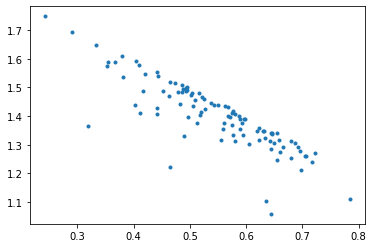

In [293]:
plt.figure();
plt.plot(curv_score, rect_score,'.')

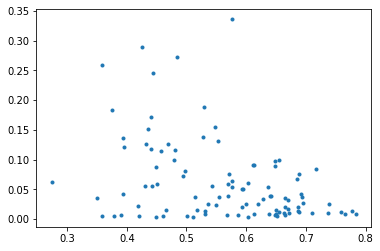

In [270]:
plt.figure();
plt.plot(curv_score, lin_score,'.')

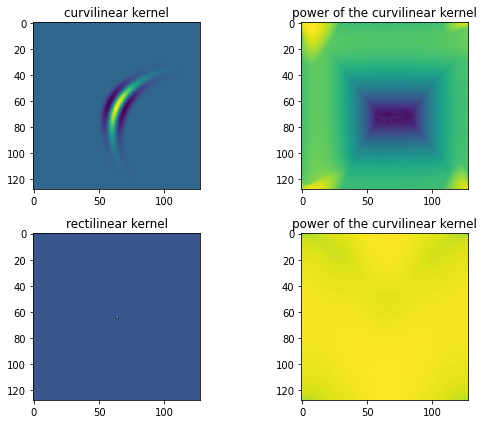

In [169]:
curvrect_score.show_kernel_example()

In [294]:
# visualizing the filter bank

rect_kernel_list = curvrect_score.kernels['rect_freq']
rect_spat_kernel_list = curvrect_score.kernels['rect_space']
curv_kernel_list = curvrect_score.kernels['curv_freq']
curv_spat_kernel_list = curvrect_score.kernels['curv_space']
lin_kernel_list = curvrect_score.kernels['lin_freq']
lin_spat_kernel_list = curvrect_score.kernels['lin_space']

curv_kernel_pars = curvrect_score.curv_kernel_pars
rect_kernel_pars = curvrect_score.rect_kernel_pars
lin_kernel_pars = curvrect_score.lin_kernel_pars

all_kernel_pars = np.concatenate([rect_kernel_pars, curv_kernel_pars, lin_kernel_pars], axis=0)


In [297]:
np.unique(rect_kernel_pars[:,0])

array([0.39269908, 1.11072073, 4.44288294, 5.283508  ])

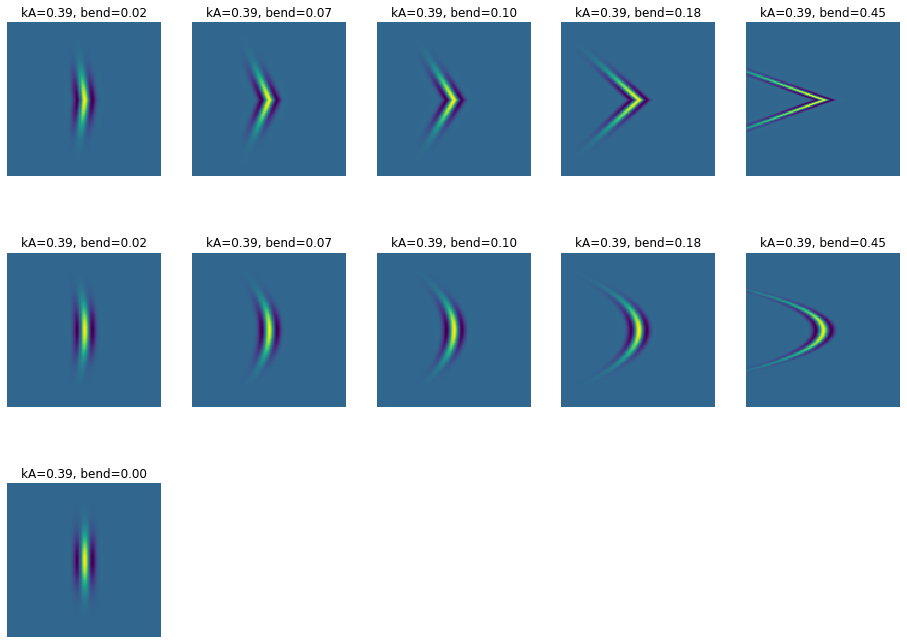

In [298]:
plt.figure(figsize=(16,12))

sc = 0.39

kk2plot = np.where((rect_kernel_pars[:,2]==0) & (np.round(rect_kernel_pars[:,0],2)==sc))[0]
for ki, kk in enumerate(kk2plot):
    plt.subplot(3,5,ki+1)
    plt.pcolormesh(rect_spat_kernel_list[kk])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('kA=%.2f, bend=%.2f'%(rect_kernel_pars[kk,0],rect_kernel_pars[kk,1]))

kk2plot = np.where((curv_kernel_pars[:,2]==0) & (np.round(curv_kernel_pars[:,0],2)==sc))[0]
for ki, kk in enumerate(kk2plot):
    plt.subplot(3,5,ki+6)
    plt.pcolormesh(curv_spat_kernel_list[kk])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('kA=%.2f, bend=%.2f'%(curv_kernel_pars[kk,0],curv_kernel_pars[kk,1]))
    
kk2plot = np.where((lin_kernel_pars[:,2]==0) & (np.round(lin_kernel_pars[:,0],2)==sc))[0]
for ki, kk in enumerate(kk2plot):
    plt.subplot(3,5,ki+11)
    plt.pcolormesh(lin_spat_kernel_list[kk])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('kA=%.2f, bend=%.2f'%(lin_kernel_pars[kk,0],lin_kernel_pars[kk,1]))

In [299]:
image_brick = nsd_utils.get_image_data(1)
images_chosen = nsd_utils.image_uncolorize_fn(image_brick[image_ind,:,:,:])


Loading images for subject 1

image data size: (10000, 3, 240, 240) , dtype: uint8 , value range: 0 255


In [340]:
ii = 1
image = images_chosen[ii,0,:,:]
# image_size=128;
image_size=240;
image = resize(image, (image_size,image_size))

# orig_size = image.shape
# if image.shape[0]%3 == 0:
#     patch_size = 3
# else:
#     patch_size = 4

# """create patches with the patch_size"""
# patches = view_as_windows(image, (patch_size,patch_size), patch_size)

# """ caculate norm of the local patches """ 
# local_norm = np.sqrt(np.einsum('ijkl->ij',patches**2))
# local_norm[local_norm<1] = 1

# """normalize local patches """ 
# normed_patches = patches/local_norm[:,:,np.newaxis,np.newaxis]

# """reshape normalized local patch to original shape """ 
# #         local_normed_image = normed_patches.transpose(0,2,1,3).reshape(-1,normed_patches.shape[1]*normed_patches.shape[3])
# local_normed_image = rearrange(normed_patches,'h w c d -> (h c) (w d)')
   
local_normed_image = image;
    
fft_image = np.fft.fft2(local_normed_image)
fft_image_list = []
fft_image_list.append(fft_image) 

(0.0, 240.0, 240.0, 0.0)

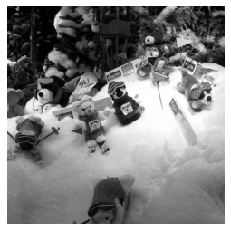

In [341]:
plt.figure()
plt.pcolormesh(local_normed_image, cmap='gray', clim=[0,1])
plt.axis('square')
plt.gca().invert_yaxis()
plt.axis('off')

In [342]:
curv_kernel_list = curvrect_score.kernels['curv_freq']
all_kernels = np.dstack(curv_kernel_list)

"""calculate kernel norm for normalization"""
all_kernels_power =  np.einsum('ijk,ijk->k',np.abs(all_kernels),np.abs(all_kernels))
all_kernels_power =  np.sqrt(all_kernels_power)

"""stack fft image list to a 3d array"""
fft_images        = np.dstack(fft_image_list)
all_conved_images = np.abs(np.fft.ifft2(fft_images[:,:,np.newaxis,:]*all_kernels[:,:,:,np.newaxis],axes=(0,1)))
all_conved_images = np.power(all_conved_images,1/2) ## power correction
all_conved_images = all_conved_images/all_kernels_power[np.newaxis, np.newaxis,:,np.newaxis]

curv_max_response = np.max(all_conved_images, axis=2)

rect_kernel_list = curvrect_score.kernels['rect_freq']
all_kernels = np.dstack(rect_kernel_list)

"""calculate kernel norm for normalization"""
all_kernels_power =  np.einsum('ijk,ijk->k',np.abs(all_kernels),np.abs(all_kernels))
all_kernels_power =  np.sqrt(all_kernels_power)

"""stack fft image list to a 3d array"""
fft_images        = np.dstack(fft_image_list)
all_conved_images = np.abs(np.fft.ifft2(fft_images[:,:,np.newaxis,:]*all_kernels[:,:,:,np.newaxis],axes=(0,1)))
all_conved_images = np.power(all_conved_images,1/2) ## power correction
all_conved_images = all_conved_images/all_kernels_power[np.newaxis, np.newaxis,:,np.newaxis]

rect_max_response = np.max(all_conved_images, axis=2)

lin_kernel_list = curvrect_score.kernels['lin_freq']
all_kernels = np.dstack(lin_kernel_list)

"""calculate kernel norm for normalization"""
all_kernels_power =  np.einsum('ijk,ijk->k',np.abs(all_kernels),np.abs(all_kernels))
all_kernels_power =  np.sqrt(all_kernels_power)

"""stack fft image list to a 3d array"""
fft_images        = np.dstack(fft_image_list)
all_conved_images = np.abs(np.fft.ifft2(fft_images[:,:,np.newaxis,:]*all_kernels[:,:,:,np.newaxis],axes=(0,1)))
all_conved_images = np.power(all_conved_images,1/2) ## power correction
all_conved_images = all_conved_images/all_kernels_power[np.newaxis, np.newaxis,:,np.newaxis]

lin_max_response = np.max(all_conved_images, axis=2)

ValueError: operands could not be broadcast together with shapes (240,240,1,1) (128,128,160,1) 

In [338]:
which_max = np.argmax(np.array([curv_max_response, \
                                           rect_max_response, \
                                           lin_max_response]), axis=0)

In [318]:
which_max.shape

(128, 128, 1)

Text(0.5, 1.0, 'which max')

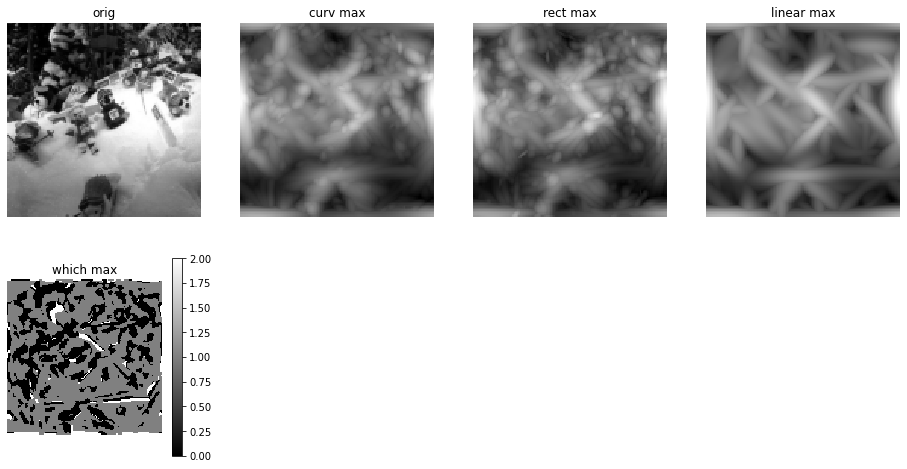

In [339]:
plt.figure(figsize=(16,8));
plt.subplot(2,4,1);
plt.pcolormesh(local_normed_image, cmap='gray', clim=[0,1.0])
plt.axis('square')
plt.gca().invert_yaxis()
plt.axis('off')
plt.title('orig')

plt.subplot(2,4,2);
plt.pcolormesh(np.fft.fftshift(curv_max_response[:,:,0]), cmap='gray', clim=[0,1.0])
plt.axis('square')
plt.gca().invert_yaxis()
plt.axis('off')
plt.title('curv max')

plt.subplot(2,4,3);
plt.pcolormesh(np.fft.fftshift(rect_max_response[:,:,0]), cmap='gray', clim=[0,1.0])
plt.axis('square')
plt.gca().invert_yaxis()
plt.axis('off')
plt.title('rect max')

plt.subplot(2,4,4);
plt.pcolormesh(np.fft.fftshift(lin_max_response[:,:,0]), cmap='gray', clim=[0,1.0])
plt.axis('square')
plt.gca().invert_yaxis()
plt.axis('off')
plt.title('linear max')

plt.subplot(2,4,5);
plt.pcolormesh(np.fft.fftshift(which_max[:,:,0]), cmap='gray')
plt.colorbar()
plt.axis('square')
plt.gca().invert_yaxis()
plt.axis('off')
plt.title('which max')



In [305]:
unbends = np.unique(curv_kernel_pars[:,1])
avg_in_bend = np.zeros((len(unbends), 128,128,1))
for bi, bend in enumerate(unbends):
    inds = curv_kernel_pars[:,1]==bend
    avg_in_bend[bi,:,:,:] = np.mean(all_conved_images[:,:,inds,:], axis=2)

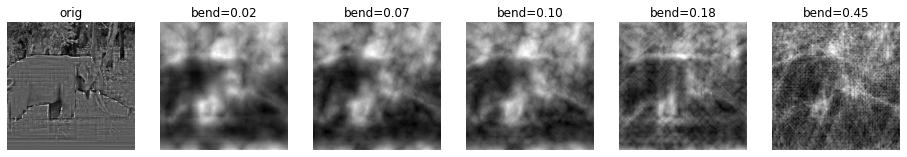

In [306]:
plt.figure(figsize=(16,16));
plt.subplot(1,6,1);
plt.pcolormesh(local_normed_image, cmap='gray', clim=[0,1.0])
plt.axis('square')
plt.gca().invert_yaxis()
plt.axis('off')
plt.title('orig')

for bi in range(5):
    plt.subplot(1,6,bi+2)
    plt.pcolormesh(np.fft.fftshift(avg_in_bend[bi,:,:,0]), cmap='gray', clim=[0,1.0])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('bend=%.2f'%(unbends[bi]))

In [307]:
unscales = np.unique(curv_kernel_pars[:,0])
avg_in_scale = np.zeros((len(unscales), 128,128,1))
for si, scale in enumerate(unscales):
    inds = curv_kernel_pars[:,0]==scale
    avg_in_scale[si,:,:,:] = np.mean(all_conved_images[:,:,inds,:], axis=2)

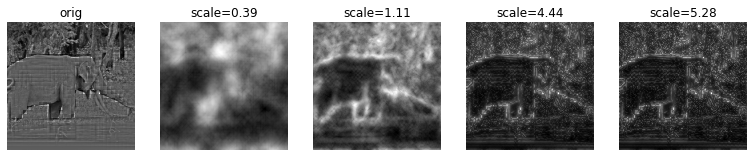

In [308]:
plt.figure(figsize=(16,16));
plt.subplot(1,6,1);
plt.pcolormesh(local_normed_image, cmap='gray', clim=[0,1.0])
plt.axis('square')
plt.gca().invert_yaxis()
plt.axis('off')
plt.title('orig')

for si in range(len(unscales)):
    plt.subplot(1,6,si+2)
    plt.pcolormesh(np.fft.fftshift(avg_in_scale[si,:,:,0]), cmap='gray', clim=[0,1.0])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('scale=%.2f'%(unscales[si]))

In [283]:
unorients = np.unique(curv_kernel_pars[:,2])
avg_in_orient = np.zeros((len(unorients), 128,128,1))
for oi, orient in enumerate(unorients):
    inds = curv_kernel_pars[:,2]==orient
    avg_in_orient[oi,:,:,:] = np.mean(all_conved_images[:,:,inds,:], axis=2)

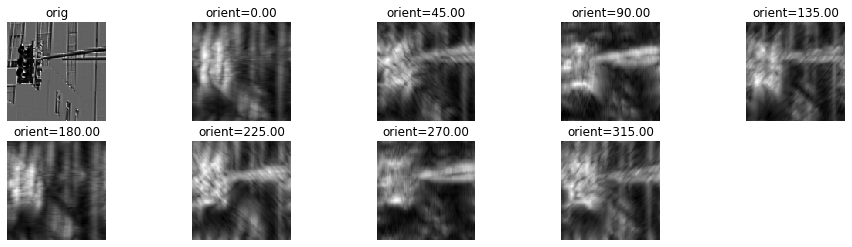

In [285]:
plt.figure(figsize=(16,4));
plt.subplot(2,5,1);
plt.pcolormesh(local_normed_image, cmap='gray', clim=[0,1.0])
plt.axis('square')
plt.gca().invert_yaxis()
plt.axis('off')
plt.title('orig')

for oi in range(len(unorients)):
    plt.subplot(2,5,oi+2)
    plt.pcolormesh(np.fft.fftshift(avg_in_orient[oi,:,:,0]), cmap='gray', clim=[0,1.0])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('orient=%.2f'%(unorients[oi]*180/np.pi))

In [286]:
unorients

array([0.        , 0.78539816, 1.57079633, 2.35619449, 3.14159265,
       3.92699082, 4.71238898, 5.49778714])

In [194]:
import scipy.stats
# curv_score_z = scipy.stats.zscore(curv_score)
# rect_score_z = scipy.stats.zscore(rect_score)
# lin_score_z = scipy.stats.zscore(lin_score)

# combined_score = curv_score_z/(curv_score_z+rect_score_z+lin_score_z)
# combined_score = rect_score_z/(curv_score_z+rect_score_z+lin_score_z)
# combined_score = (curv_score_z-rect_score_z)/(curv_score_z+rect_score_z)
# combined_score = curv_score_z - rect_score_z

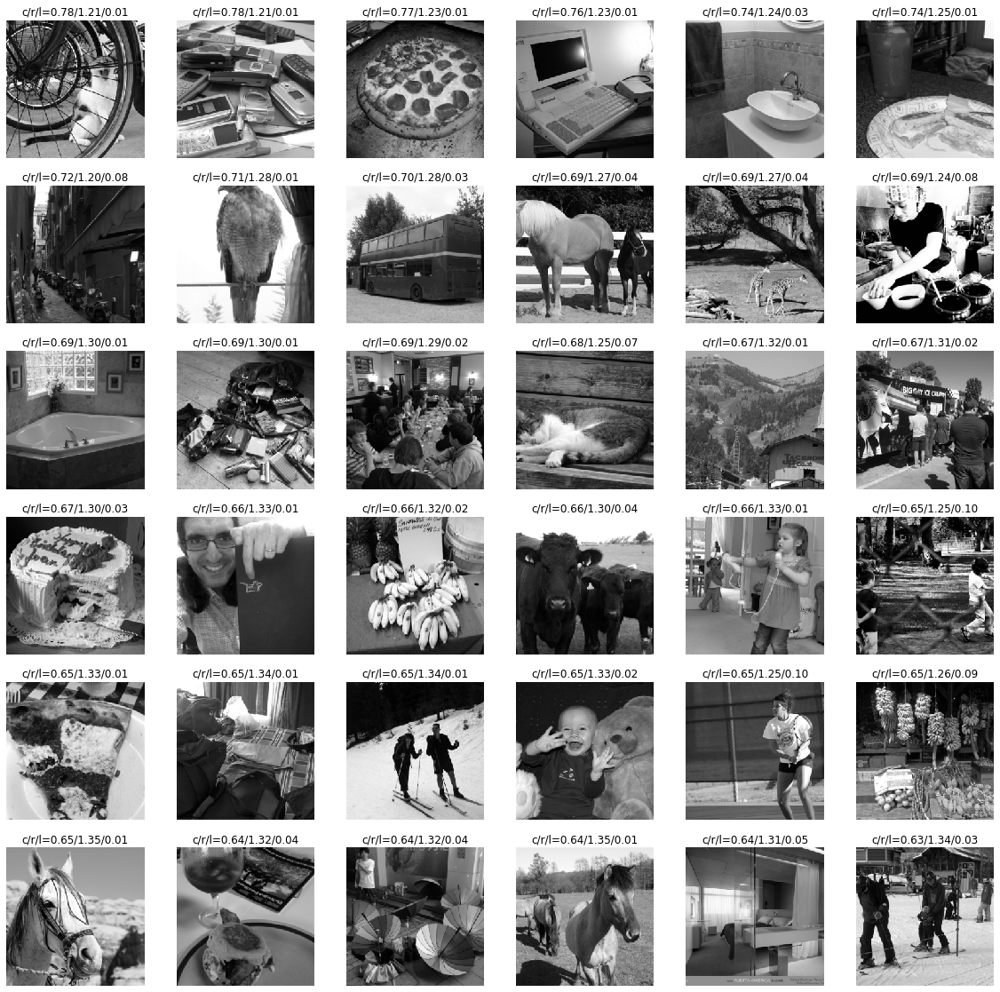

In [287]:
# Plot images sorted by their curviness

sort_order = np.flip(np.argsort(curv_score))[0:36]

plt.figure(figsize=(20,20));
for pi, ii in enumerate(sort_order):
    
    plt.subplot(6,6,pi+1)
    plt.pcolormesh(images_chosen[ii,0,:,:],cmap='gray',clim=[0,1])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('c/r/l=%.2f/%.2f/%.2f'%(curv_score[ii], rect_score[ii], lin_score[ii]))
    

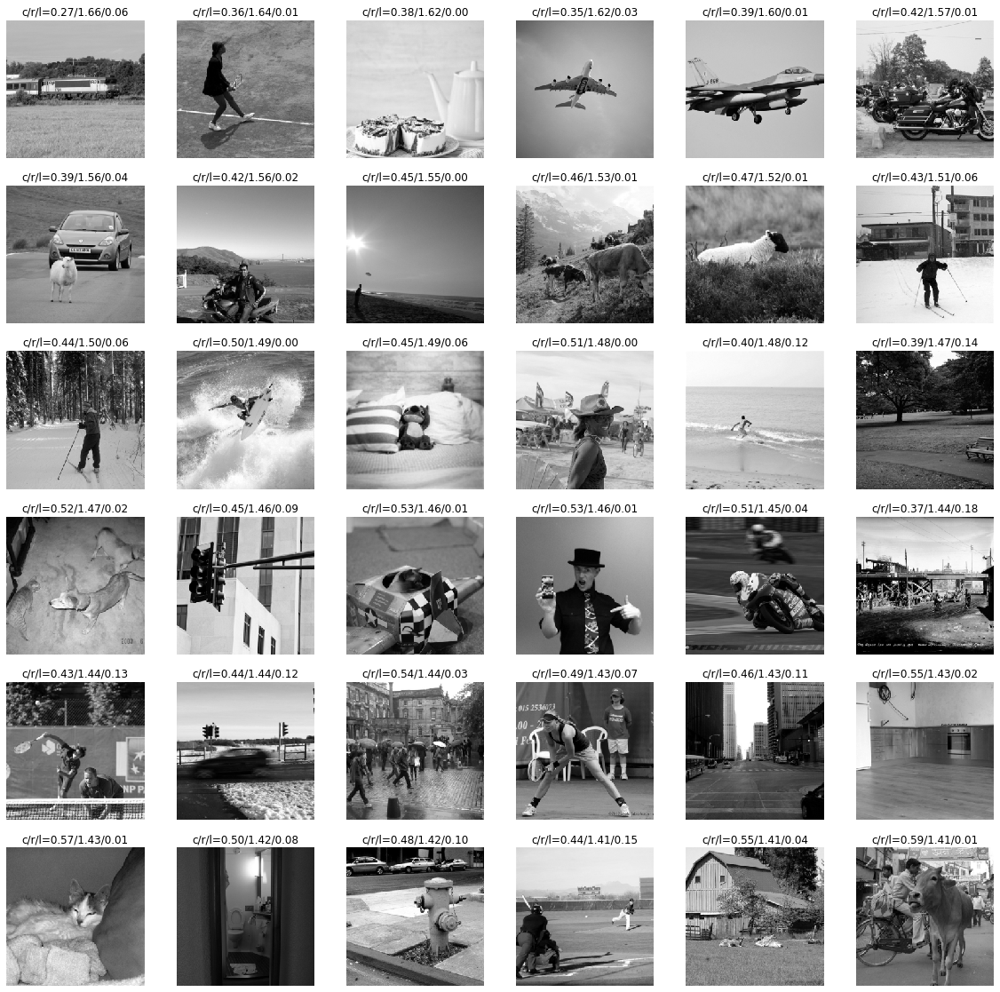

In [288]:
# Plot images sorted by their curviness

sort_order = np.flip(np.argsort(rect_score))[0:36]

plt.figure(figsize=(20,20));
for pi, ii in enumerate(sort_order):
    
    plt.subplot(6,6,pi+1)
    plt.pcolormesh(images_chosen[ii,0,:,:],cmap='gray',clim=[0,1])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('c/r/l=%.2f/%.2f/%.2f'%(curv_score[ii], rect_score[ii], lin_score[ii]))
    

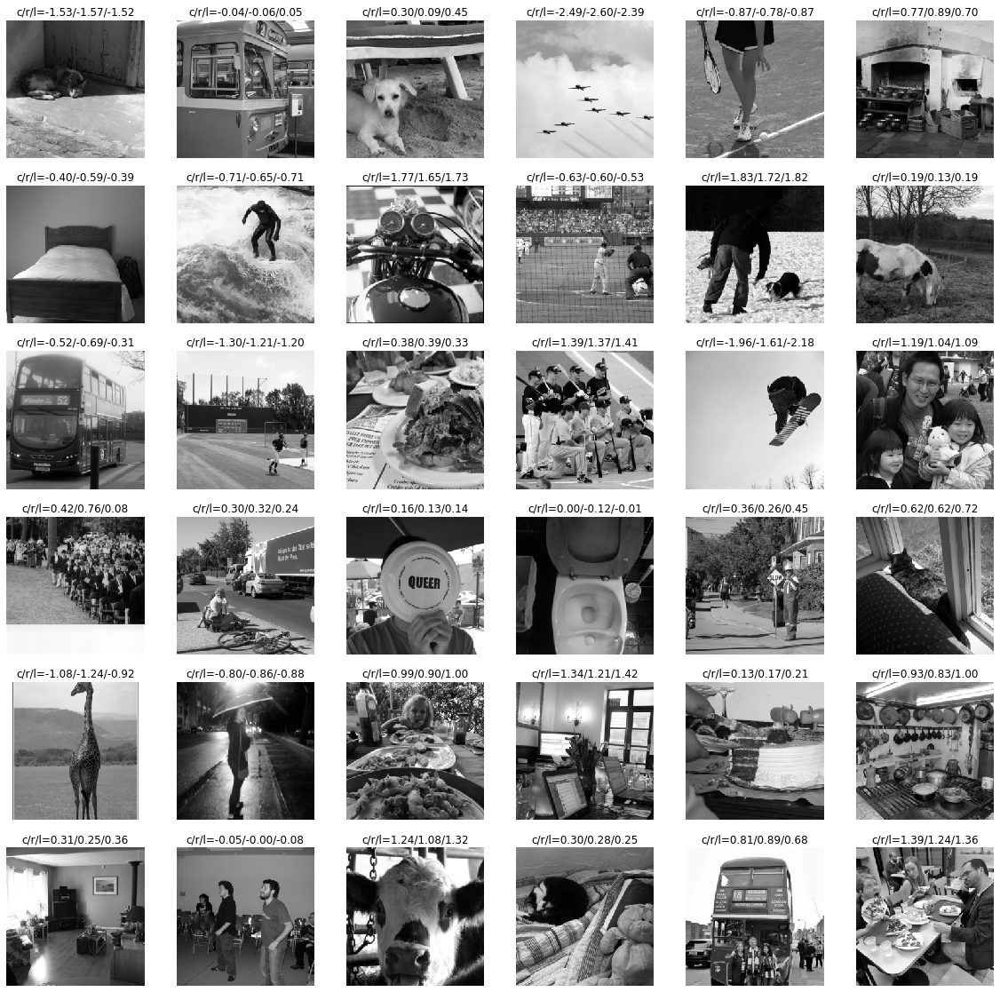

In [219]:
# Plot images sorted by their curviness

sort_order = np.flip(np.argsort(lin_score))[0:36]

plt.figure(figsize=(20,20));
for pi, ii in enumerate(sort_order):
    
    plt.subplot(6,6,pi+1)
    plt.pcolormesh(images_chosen[ii,0,:,:],cmap='gray',clim=[0,1])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('c/r/l=%.2f/%.2f/%.2f'%(curv_score_z[ii], rect_score_z[ii], lin_score_z[ii]))
    

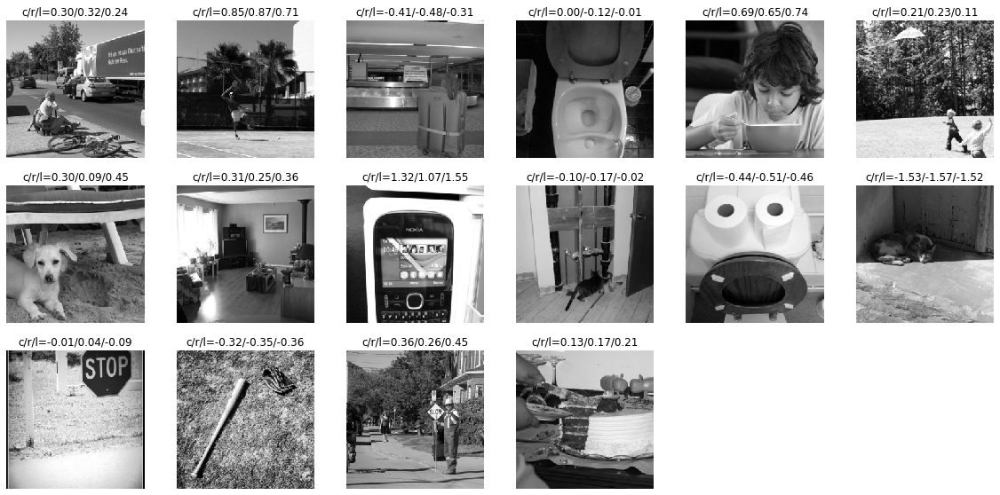

In [198]:
# Plot images sorted by their curviness

sort_order = np.where(best_bend==0)[0][0:36]

plt.figure(figsize=(20,20));
for pi, ii in enumerate(sort_order):
    
    plt.subplot(6,6,pi+1)
    plt.pcolormesh(images_chosen[ii,0,:,:],cmap='gray',clim=[0,1])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('c/r/l=%.2f/%.2f/%.2f'%(curv_score[ii], rect_score[ii], lin_score[ii]))
    

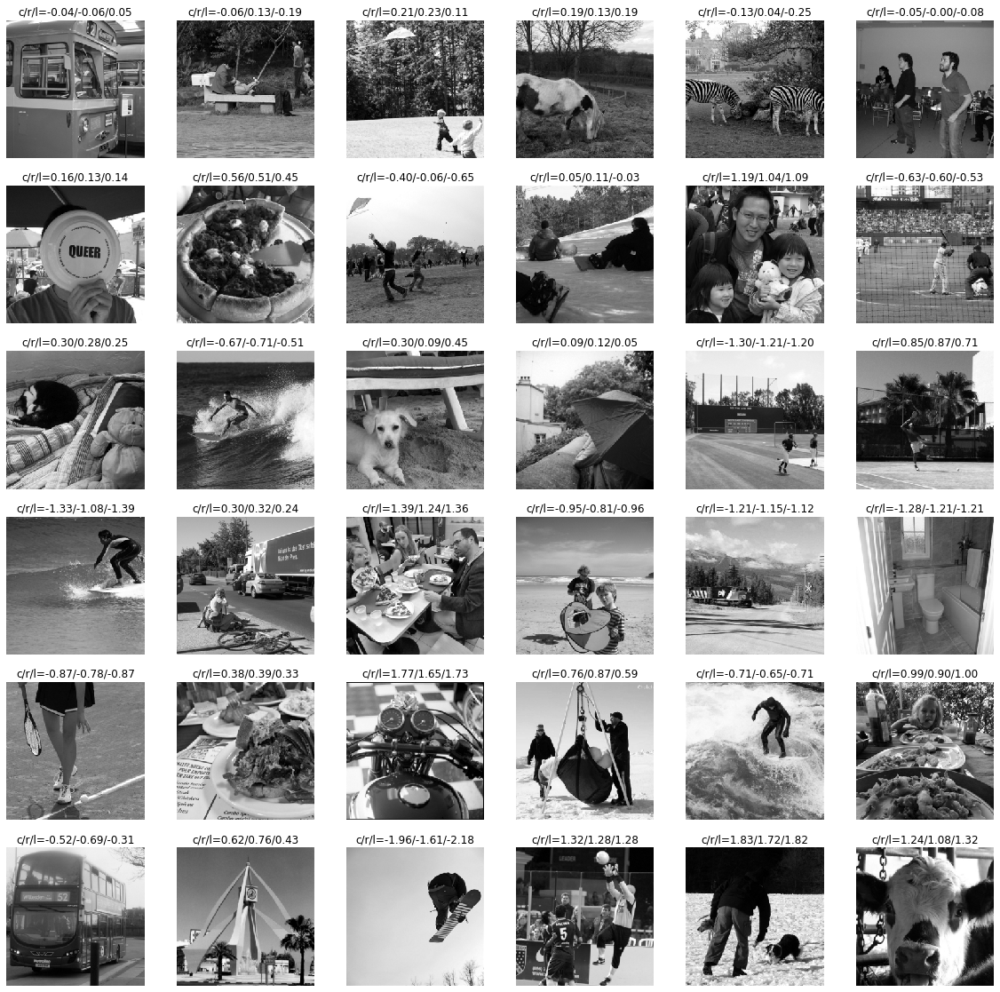

In [195]:
# Plot images sorted by their curviness

sort_order = np.flip(np.argsort(combined_score))[0:36]

plt.figure(figsize=(20,20));
for pi, ii in enumerate(sort_order):
    
    plt.subplot(6,6,pi+1)
    plt.pcolormesh(images_chosen[ii,0,:,:],cmap='gray',clim=[0,1])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('c/r/l=%.2f/%.2f/%.2f'%(curv_score[ii], rect_score[ii], lin_score[ii]))
    

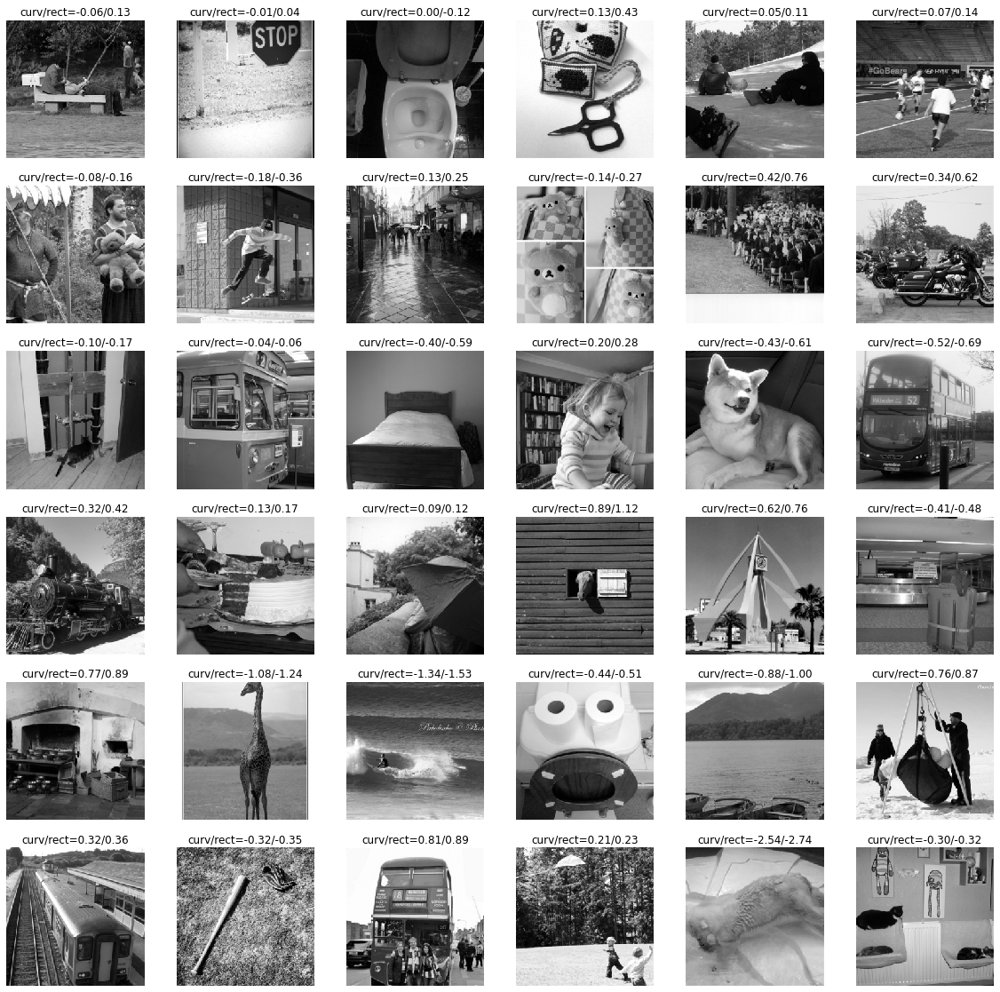

In [179]:
# Plot images sorted by their curviness

sort_order = np.argsort(combined_score)[0:36]

plt.figure(figsize=(20,20));
for pi, ii in enumerate(sort_order):
    
    plt.subplot(6,6,pi+1)
    plt.pcolormesh(images_chosen[ii,0,:,:],cmap='gray',clim=[0,1])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('curv/rect=%.2f/%.2f'%(curv_score[ii], rect_score[ii]))
    

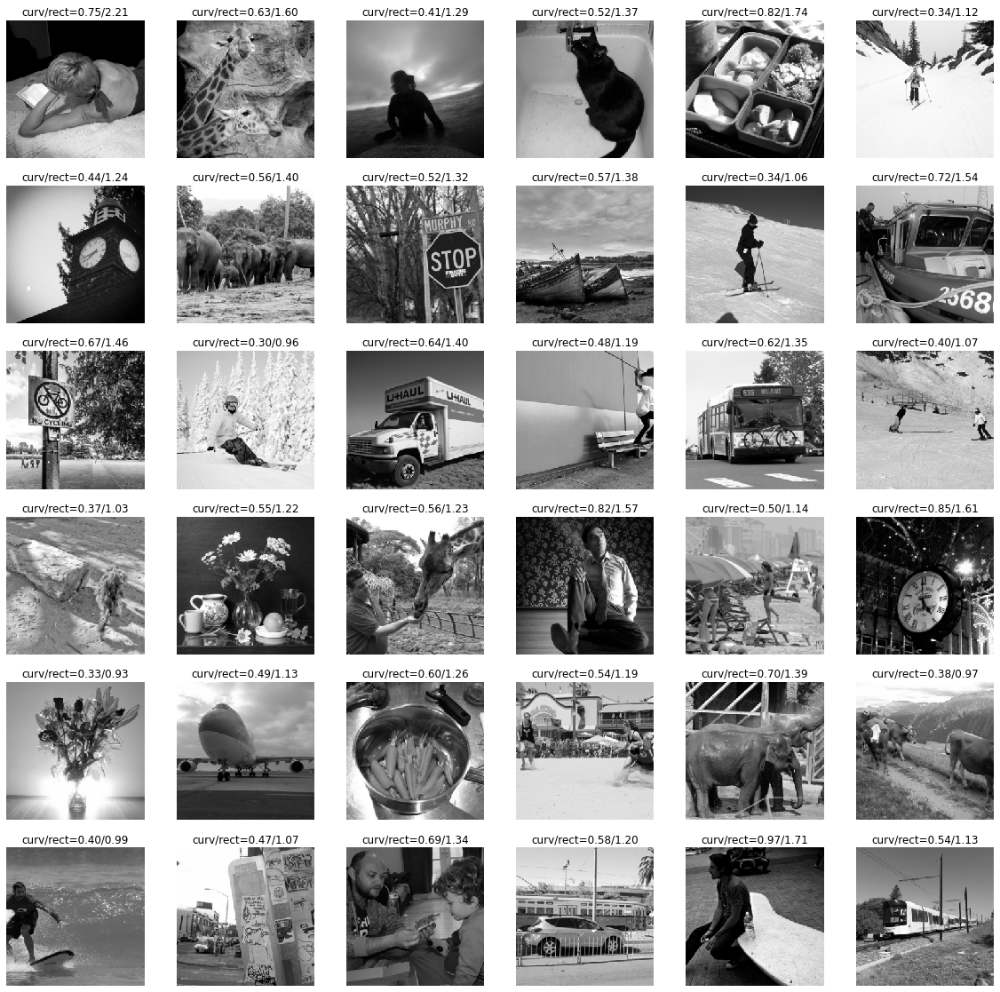

In [122]:
# Plot images sorted by their curviness

sort_order = np.argsort(combined_score)[0:36]

plt.figure(figsize=(20,20));
for pi, ii in enumerate(sort_order):
    
    plt.subplot(6,6,pi+1)
    plt.pcolormesh(images_chosen[ii,0,:,:],cmap='gray',clim=[0,1])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('curv/rect=%.2f/%.2f'%(curv_score[ii], rect_score[ii]))
    

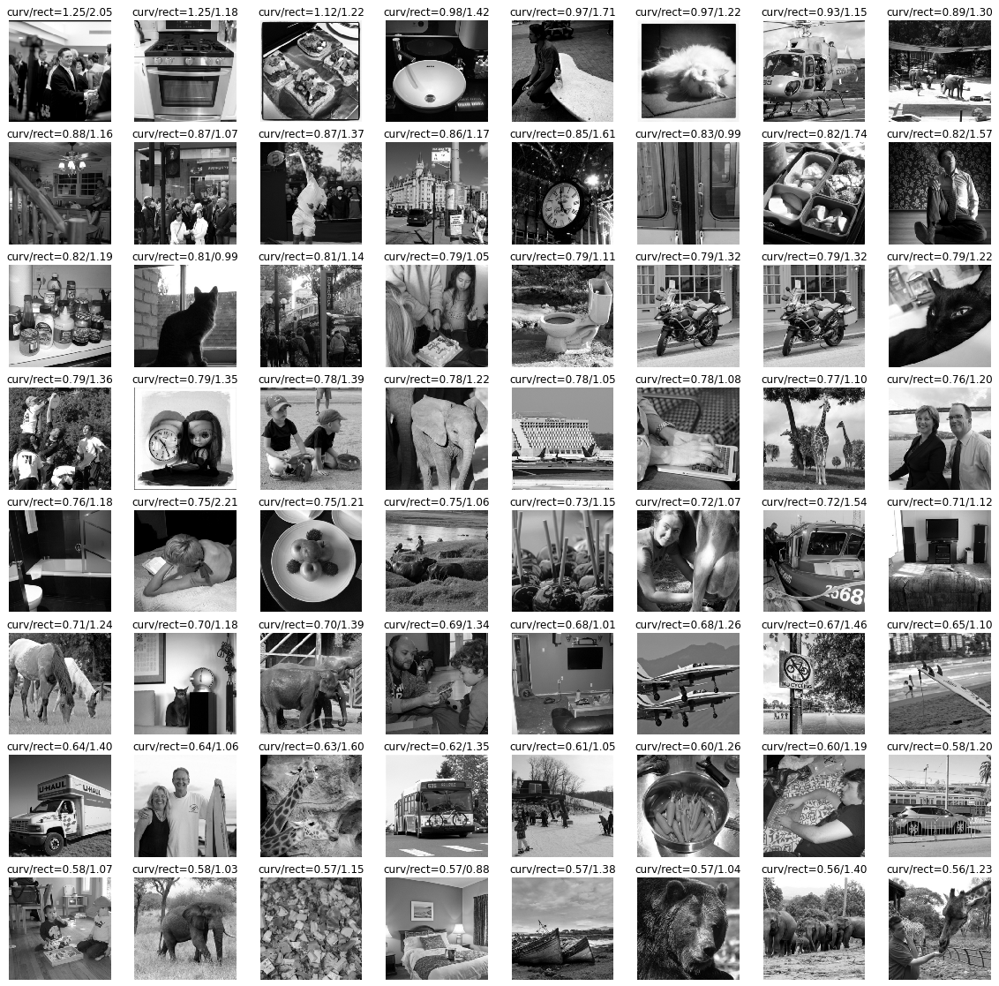

In [111]:
# Plot images sorted by their curviness

sort_order = np.flip(np.argsort(curv_score))[0:64]

plt.figure(figsize=(20,20));
for pi, ii in enumerate(sort_order):
    
    plt.subplot(8,8,pi+1)
    plt.pcolormesh(images_chosen[ii,0,:,:],cmap='gray',clim=[0,1])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('curv/rect=%.2f/%.2f'%(curv_score[ii], rect_score[ii]))
    

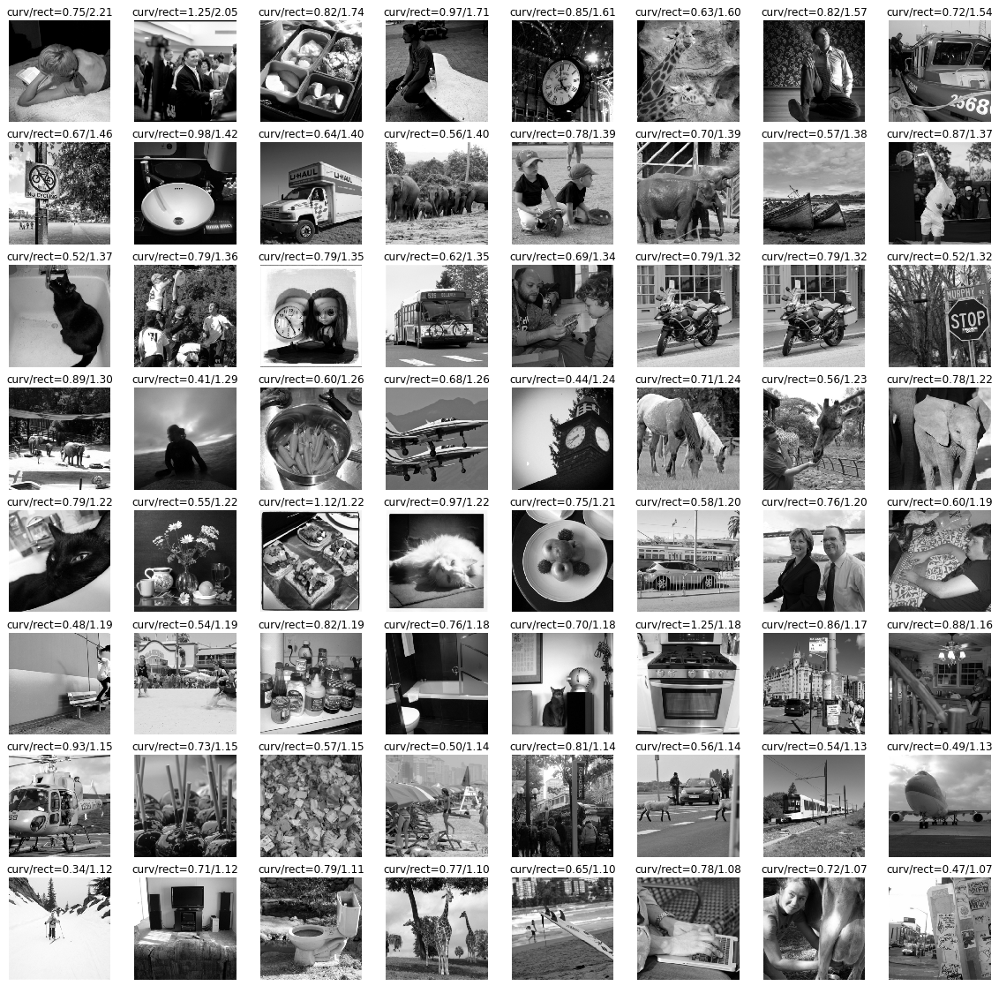

In [112]:
# Plot images sorted by their rectilinearity

sort_order = np.flip(np.argsort(rect_score))[0:64]

plt.figure(figsize=(20,20));
for pi, ii in enumerate(sort_order):
    
    plt.subplot(8,8,pi+1)
    plt.pcolormesh(images_chosen[ii,0,:,:],cmap='gray',clim=[0,1])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('curv/rect=%.2f/%.2f'%(curv_score[ii], rect_score[ii]))
    

In [74]:
save_filename = os.path.join(default_paths.sketch_token_feat_path, 'cluster_ims_curv_rect_values.csv')
import pandas as pd
curvrect = pd.read_csv(save_filename)
curvrect

best_scale = np.array(curvrect['best_scale'])
best_bend = np.array(curvrect['best_bend'])
best_orient = np.array(curvrect['best_orient'])
best_is_curved = np.array(curvrect['best_is_curved'])
best_kernel_index = np.array(curvrect['best_kernel_index'])

curvrect

,files,curv_values,rect_values,best_scale,best_bend,best_orient,best_is_curved,best_kernel_index
0,/user_data/mmhender/features/sketch_tokens/clu...,1.035952,42.199515,0.098175,0.02,4.712389,0.0,138
1,/user_data/mmhender/features/sketch_tokens/clu...,0.000000,41.439501,0.098175,0.02,0.000000,0.0,120
2,/user_data/mmhender/features/sketch_tokens/clu...,4.314351,34.955638,0.098175,0.02,1.308997,0.0,125
3,/user_data/mmhender/features/sketch_tokens/clu...,1.179869,41.886255,0.098175,0.02,1.570796,0.0,126
4,/user_data/mmhender/features/sketch_tokens/clu...,5.050182,34.609037,0.098175,0.02,0.261799,0.0,121
...,...,...,...,...,...,...,...,...
145,/user_data/mmhender/features/sketch_tokens/clu...,1.534525,43.865286,0.098175,0.02,3.141593,0.0,132
146,/user_data/mmhender/features/sketch_tokens/clu...,7.474825,36.222955,0.098175,0.02,4.712389,0.0,138
147,/user_data/mmhender/features/sketch_tokens/clu...,8.506347,33.066804,0.098175,0.02,1.570796,1.0,366
148,/user_data/mmhender/features/sketch_tokens/clu...,0.892457,40.870580,0.098175,0.02,4.712389,0.0,138


In [75]:
# visualizing the filter bank

rect_kernel_list = curvrect_score.kernels['rect_freq']
rect_spat_kernel_list = curvrect_score.kernels['rect_space']
curv_kernel_list = curvrect_score.kernels['curv_freq']
curv_spat_kernel_list = curvrect_score.kernels['curv_space']

curv_kernel_pars = curvrect_score.curv_kernel_pars
rect_kernel_pars = curvrect_score.rect_kernel_pars
all_kernel_pars = np.concatenate([rect_kernel_pars, curv_kernel_pars], axis=0)

all_kernels = np.concatenate([np.dstack(rect_kernel_list), np.dstack(curv_kernel_list)], axis=2)
all_spat_kernels = np.concatenate([np.dstack(rect_spat_kernel_list), np.dstack(curv_spat_kernel_list)], axis=2)

# all_kernels = all_kernels/np.max(np.max(all_kernels,axis=0), axis=0)

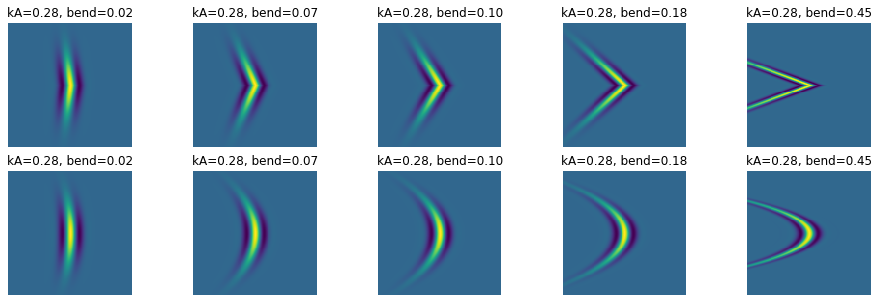

In [70]:
plt.figure(figsize=(16,5))

kk2plot = np.where((rect_kernel_pars[:,2]==0) & (np.round(rect_kernel_pars[:,0],2)==0.28))[0]
for ki, kk in enumerate(kk2plot):
    plt.subplot(2,5,ki+1)
    plt.pcolormesh(rect_spat_kernel_list[kk])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('kA=%.2f, bend=%.2f'%(rect_kernel_pars[kk,0],rect_kernel_pars[kk,1]))

kk2plot = np.where((curv_kernel_pars[:,2]==0) & (np.round(curv_kernel_pars[:,0],2)==0.28))[0]
for ki, kk in enumerate(kk2plot):
    plt.subplot(2,5,ki+6)
    plt.pcolormesh(curv_spat_kernel_list[kk])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('kA=%.2f, bend=%.2f'%(curv_kernel_pars[kk,0],curv_kernel_pars[kk,1]))

In [71]:
from scipy.io import loadmat
cluster_fn = os.path.join('/user_data/mmhender/toolboxes/SketchTokens/', 'clusters.mat')
clust = loadmat(cluster_fn)
feature_ims = clust['clusters']['clusters'][0][0]


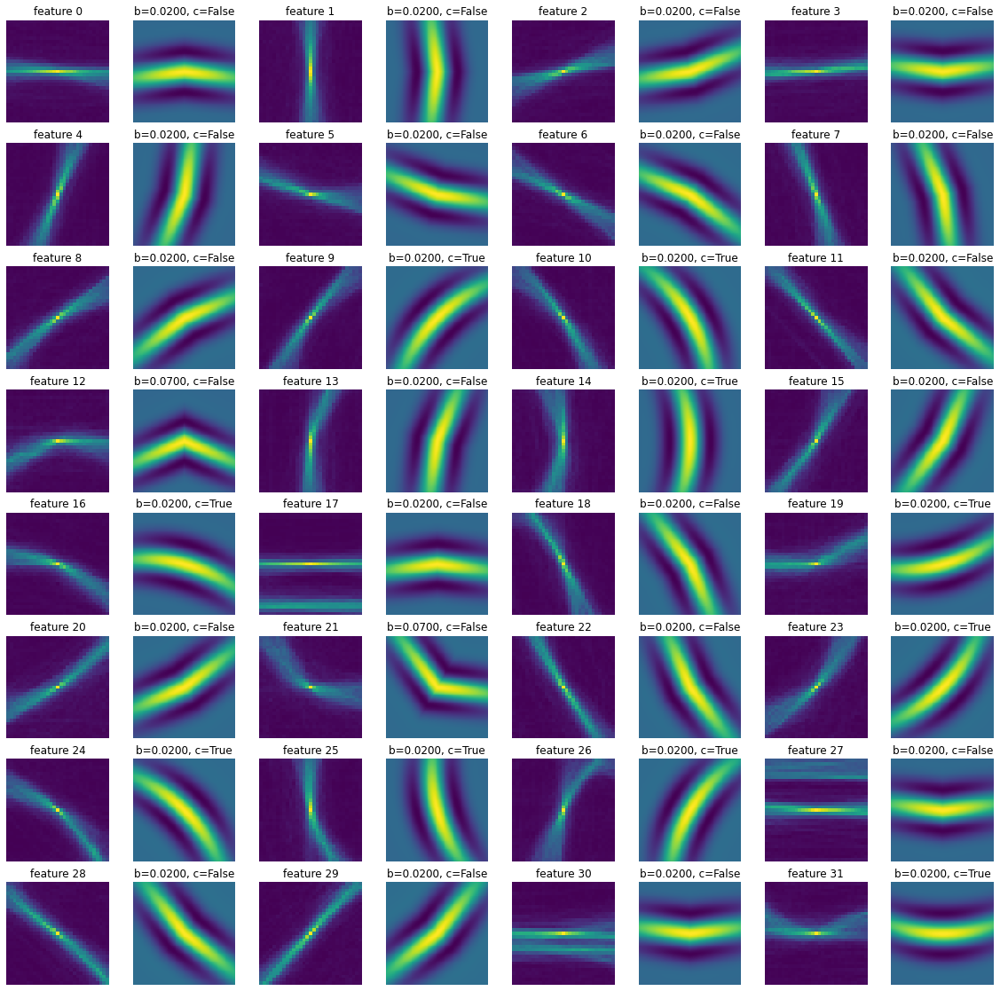

In [81]:
# Plot each image alongside its best spatial kernel

plt.figure(figsize=(20,20));
pi=0
for ii in range(32):
    pi+=1
    plt.subplot(8,8,pi)
    plt.pcolormesh(feature_ims[:,:,ii])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('feature %d'%ii)
    
    pi+=1
    plt.subplot(8,8,pi)
    plt.pcolormesh(all_spat_kernels[:,:,best_kernel_index[ii]])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('b=%.4f, c=%s'%(best_bend[ii], \
                                    best_is_curved[ii]==1))
              

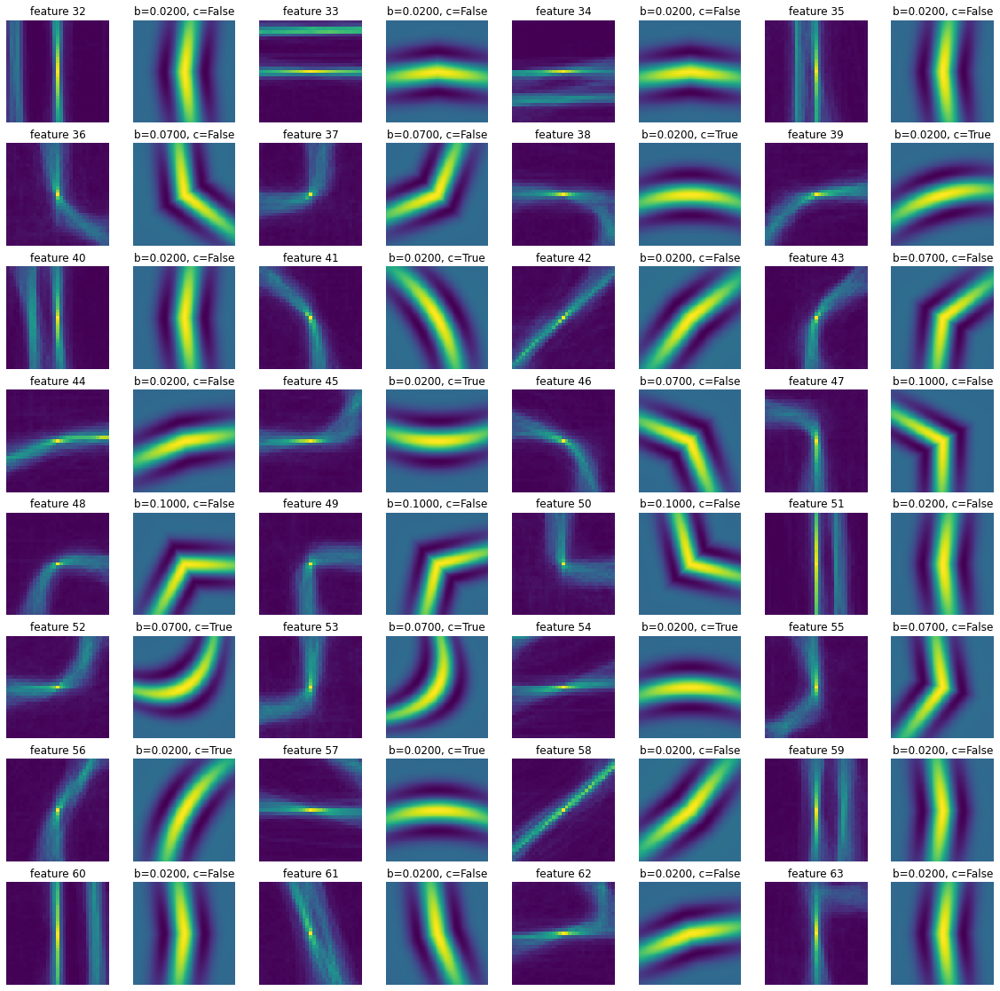

In [82]:
# Plot each image alongside its best spatial kernel

plt.figure(figsize=(20,20));
pi=0
for ii in np.arange(32,64):
    pi+=1
    plt.subplot(8,8,pi)
    plt.pcolormesh(feature_ims[:,:,ii])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('feature %d'%ii)
    
    pi+=1
    plt.subplot(8,8,pi)
    plt.pcolormesh(all_spat_kernels[:,:,best_kernel_index[ii]])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('b=%.4f, c=%s'%(best_bend[ii], \
                                    best_is_curved[ii]==1))
              

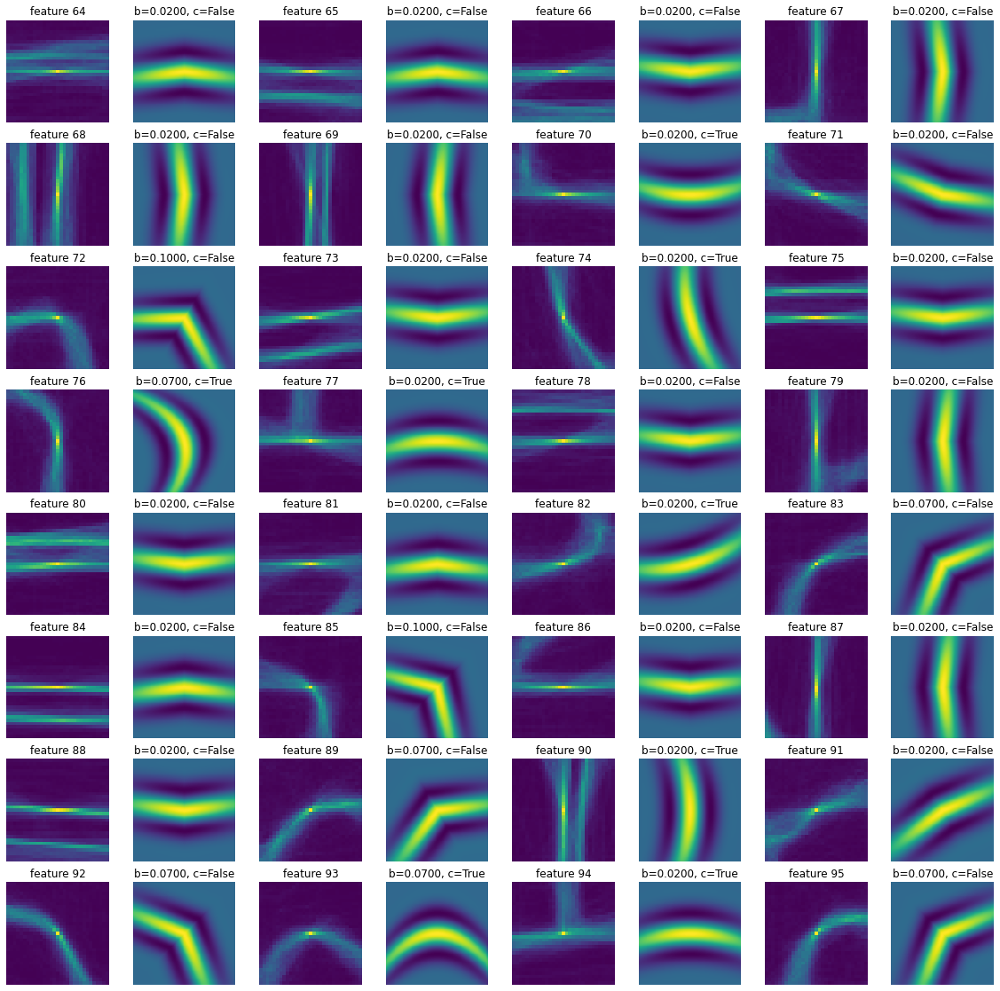

In [84]:
# Plot each image alongside its best spatial kernel

plt.figure(figsize=(20,20));
pi=0
for ii in np.arange(64,96):
    pi+=1
    plt.subplot(8,8,pi)
    plt.pcolormesh(feature_ims[:,:,ii])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('feature %d'%ii)
    
    pi+=1
    plt.subplot(8,8,pi)
    plt.pcolormesh(all_spat_kernels[:,:,best_kernel_index[ii]])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('b=%.4f, c=%s'%(best_bend[ii], \
                                    best_is_curved[ii]==1))
              

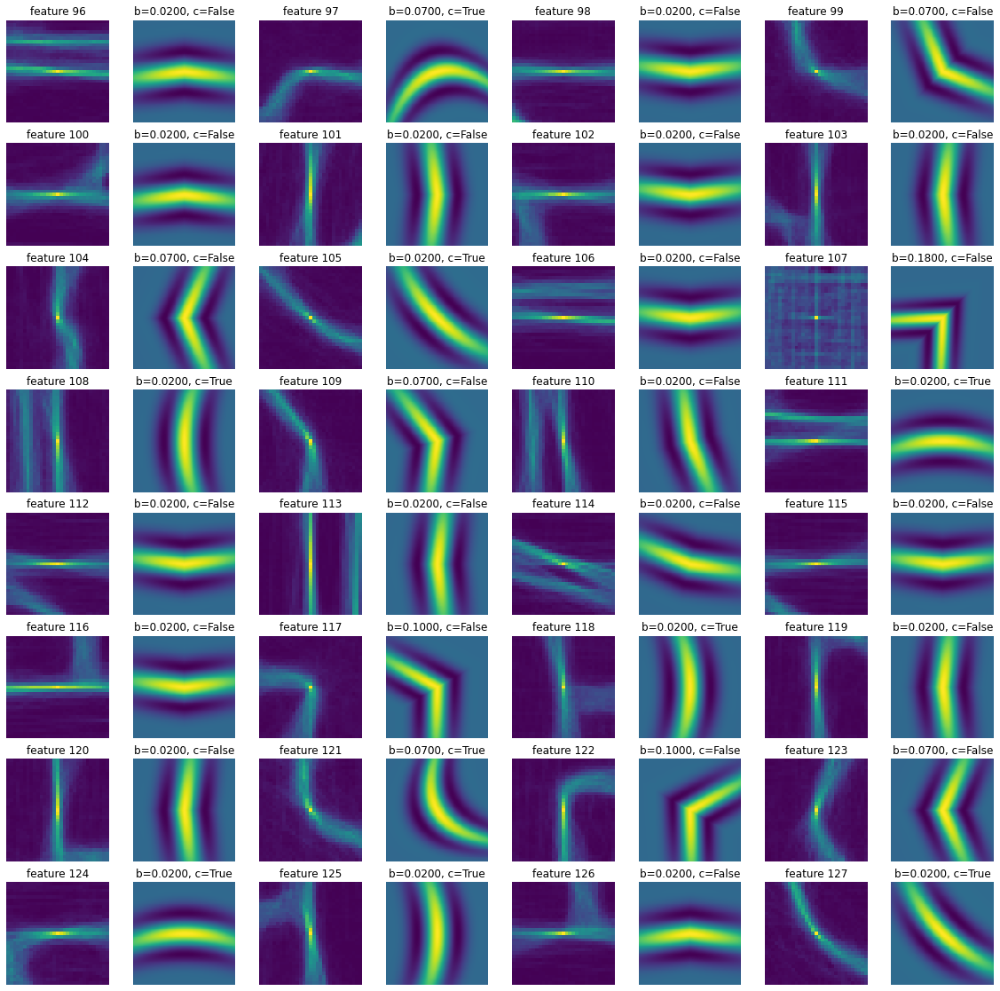

In [85]:
# Plot each image alongside its best spatial kernel

plt.figure(figsize=(20,20));
pi=0
for ii in np.arange(96,128):
    pi+=1
    plt.subplot(8,8,pi)
    plt.pcolormesh(feature_ims[:,:,ii])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('feature %d'%ii)
    
    pi+=1
    plt.subplot(8,8,pi)
    plt.pcolormesh(all_spat_kernels[:,:,best_kernel_index[ii]])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('b=%.4f, c=%s'%(best_bend[ii], \
                                    best_is_curved[ii]==1))
              

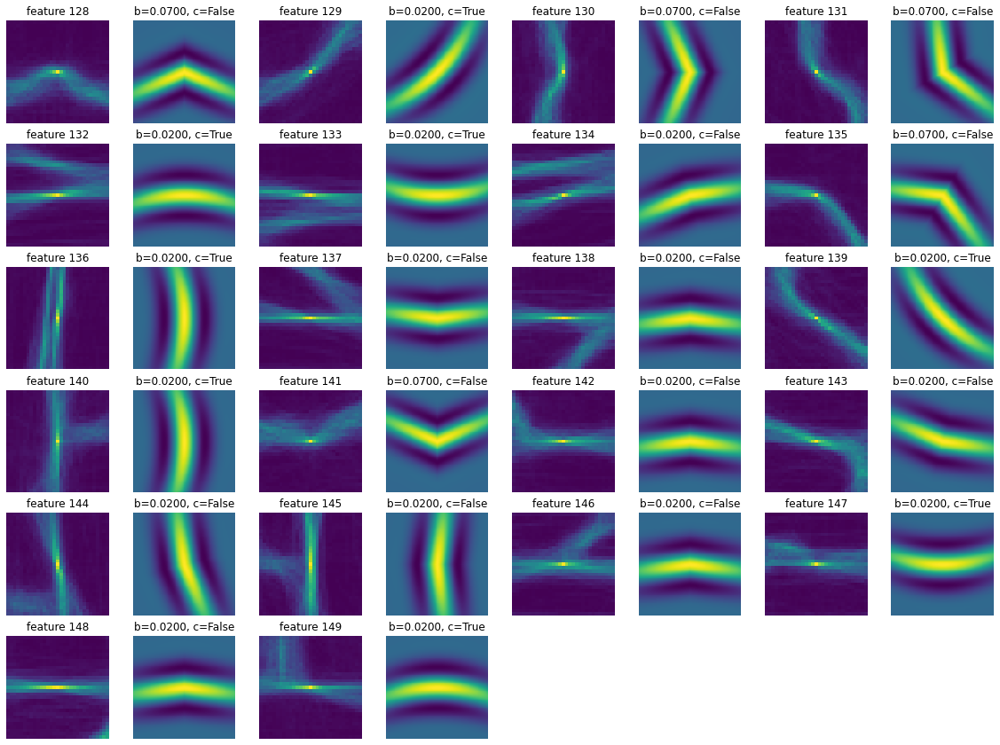

In [86]:
# Plot each image alongside its best spatial kernel

plt.figure(figsize=(20,20));
pi=0
for ii in np.arange(128, 150):
    pi+=1
    plt.subplot(8,8,pi)
    plt.pcolormesh(feature_ims[:,:,ii])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('feature %d'%ii)
    
    pi+=1
    plt.subplot(8,8,pi)
    plt.pcolormesh(all_spat_kernels[:,:,best_kernel_index[ii]])
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('b=%.4f, c=%s'%(best_bend[ii], \
                                    best_is_curved[ii]==1))
              

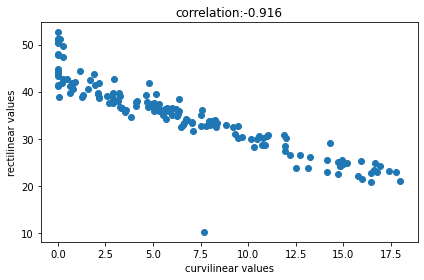

In [6]:
curvrect_score.show_correlation()

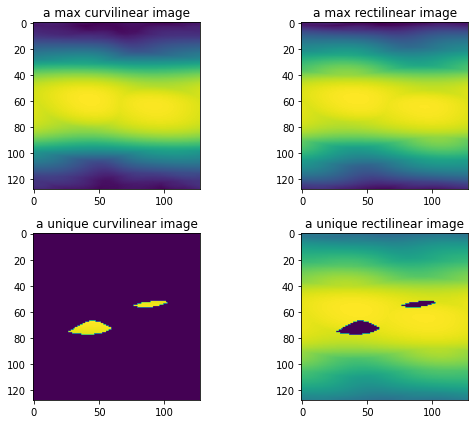

In [64]:
curvrect_score.show_curv_rect_example()

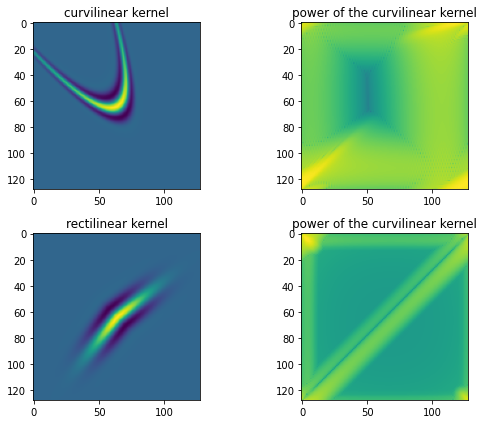

In [65]:
curvrect_score.show_kernel_example()